# BAL pseudobulk analysis, pt. 4

In [1]:
import collections
import datetime
import itertools
import functools
import json
import math
import os
import sys
import pathlib

import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib as mpl
import matplotlib.pyplot as plt
import adjustText as adjust_text
import seaborn as sns
import goatools.base
import goatools.obo_parser
import goatools.anno.genetogo_reader
import goatools.goea.go_enrichment_ns
import pybiomart
import scipy.cluster.hierarchy
import statsmodels.stats.multitest

import matplotlib_venn
import upsetplot
import gseapy
import openpyxl

In [2]:
sys.path.insert(0, "../lib/")

In [3]:
import sc_utils

In [4]:
FONT_DIR = '/projects/b1038/Pulmonary/nmarkov/fonts'
for f in os.listdir(FONT_DIR):
    if f.endswith('.ttf'):
        mpl.font_manager.fontManager.addfont(f'{FONT_DIR}/{f}')

In [5]:
mpl.rcParams["font.family"] = "Arial"
mpl.rcParams["pdf.fonttype"] = 42
# plt.rcParams['figure.constrained_layout.use'] = False
# mpl.rcParams['mathtext.default'] = 'regular'

In [6]:
%config InlineBackend.figure_format = "retina"

In [7]:
DATA = pathlib.Path('../../data/31_bal-object/')

In [8]:
ds_processed = sc.read_h5ad(DATA / '03_bal-object/03_bal-object.h5ad')

In [9]:
DATA_DIR = DATA / 'pseudobulk-gsva'

In [10]:
DEG_DIR = DATA / '11_pseudobulk-v3'

List of human transcription factros from http://humantfs.ccbr.utoronto.ca/index.php

In [11]:
# TFS = pd.read_csv(
#     "http://humantfs.ccbr.utoronto.ca/download/v_1.01/TF_names_v_1.01.txt",
#     header=None
# ).iloc[:, 0]
TFS = pd.read_csv("TF_names_v_1.01.txt", header=None).iloc[:, 0]

In [12]:
HALLMARK_IFN_ALPHA_R = json.loads(
    open('HALLMARK_INTERFERON_ALPHA_RESPONSE.v2023.2.Hs.json').read()
)['HALLMARK_INTERFERON_ALPHA_RESPONSE']['geneSymbols']

In [13]:
HALLMARK_IFN_GAMMA_R = json.loads(
    open('HALLMARK_INTERFERON_GAMMA_RESPONSE.v2023.2.Hs.json').read()
)['HALLMARK_INTERFERON_GAMMA_RESPONSE']['geneSymbols']

In [14]:
def _run_go(goeaobj, genes, alpha=0.1, id2names=None):
    TMP_FILE = "__go_temp_file"
    res = goeaobj.run_study(genes, prt=None)
    res_sig = [r for r in res if r.p_fdr_bh < alpha]
    if len(res_sig) == 0:
        return None
    goeaobj.wr_tsv(TMP_FILE, res_sig, itemid2name=id2names)
    res = pd.read_table(TMP_FILE)
    res.drop(["NS", "p_uncorrected", "study_count"], axis=1, inplace=True)
    os.unlink(TMP_FILE)
    return res


def run_go(degs, background):
    obo_file = goatools.base.download_go_basic_obo(prt=None)
    ass_file = goatools.base.download_ncbi_associations(prt=None)
    obodag = goatools.obo_parser.GODag(obo_file, prt=None)
    objanno = goatools.anno.genetogo_reader.Gene2GoReader(ass_file, prt=None)
    go_ns = {}
    go_ns["BP"] = objanno.get_ns2assc(prt=None)["BP"]
    dataset = pybiomart.Dataset(name='hsapiens_gene_ensembl', host='http://oct2014.archive.ensembl.org/')
    genes = dataset.query(attributes=['entrezgene', 'external_gene_name'])
    genes.columns = ["entrez_id", "symbol"]
    genes.set_index("symbol", inplace=True)
    genes = genes.loc[~genes.index.duplicated(), :]
    genes.dropna(inplace=True)
    genes.entrez_id = genes.entrez_id.astype(int)
    id2names = genes.reset_index().set_index("entrez_id").symbol.to_dict()
    degs = pd.Series(degs)
    degs = degs[degs.isin(genes.index)]
    background = pd.Series(background)
    background = background.loc[background.isin(genes.index)]
    goeaobj = goatools.goea.go_enrichment_ns.GOEnrichmentStudyNS(
        genes.reindex(background).entrez_id,
        go_ns,
        obodag,
        propagate_counts=False,
        alpha=0.1,
        methods=["fdr_bh"],
        log=None
    )
    degs = genes.reindex(degs).entrez_id
    if degs.size > 0:
        go_upreg = _run_go(goeaobj, degs, alpha=0.1, id2names=id2names)
    return go_upreg

In [15]:
def get_color_annotations(df, mapping):
    result = []
    for column, palette in mapping.items():
        values = df[column].unique()
        if pd.api.types.is_categorical_dtype(df[column]):
            values = df[column].cat.categories
        lut = dict(zip(values, sns.color_palette(palette, n_colors=values.size).as_hex()))
        result.append(df[column].map(lut))
    return pd.concat(result, axis=1)

In [16]:
def get_cell_type_from_slug(slug: str, ds: sc.AnnData) -> str:
    for cell_type in ds.obs.cell_type.unique():
        cell_type_slug = cell_type.replace(" ", "_").replace("/", "_")
        if slug == cell_type_slug:
            return cell_type
    raise ValueError(f"Cannot find cluster for {slug}")

In [17]:
MODEL = 'degs-status-sex'

def load_cell_type_info(folder, data_folder):
    name = folder.name
    degs = pd.read_csv(folder / MODEL / 'degs.csv', index_col=0)
    degs_filt = pd.read_csv(folder / MODEL / 'degs-filt.csv', index_col=0)
    expr = pd.read_table(data_folder / 'data' / f'{name}.txt', index_col=0)
    gene_cells = pd.read_table(data_folder / 'data' / f'{name}-n_cells.txt', index_col=0)
    meta = pd.read_csv(folder / 'meta.csv', index_col=0)

    go_ctrl = folder / MODEL / 'go-control.csv'
    if go_ctrl.exists():
        go_ctrl = pd.read_csv(go_ctrl, index_col=0)
    else:
        go_ctrl = None

    go_ssc = folder / MODEL / 'go-ssc.csv'
    if go_ssc.exists():
        go_ssc = pd.read_csv(go_ssc, index_col=0)
    else:
        go_ssc = None

    # ensure we operate on filtered samples
    gene_cells = gene_cells.loc[:, meta["External Sample ID"]]
    gene_cells = gene_cells.loc[gene_cells.sum(axis=1) > 0, :]

    return {
        'degs': degs,
        'filtered_degs': degs_filt,
        'meta': meta,
        'gene_cells': gene_cells,
        'expr': expr,
        'go_control': go_ctrl,
        'go_ssc': go_ssc,
    }


def process_cell_type(folder, data_folder):
    info = {}

    clust = get_cell_type_from_slug(folder.name, ds_processed)
    info.update(load_cell_type_info(folder, data_folder))

    return info

In [18]:
data = {}

for folder in sorted(DEG_DIR.iterdir()):
    if not folder.is_dir():
        continue
    if not (folder / MODEL).exists():
        continue
    if folder.name == 'global':
        continue
    data[folder.name] = process_cell_type(folder, DATA_DIR / folder.name)

In [19]:
data = {
    k.replace('_', ' ')\
        .replace('MoAM-3 mature', 'MoAM-2')\
        .replace('MoAM-4', 'MoAM-3')\
        .replace('gd/NKT cells', 'NK + γδT cells')\
        .replace('Perivascular', 'Interstitial'): v
    for k, v in data.items()
}

In [20]:
ds_processed.obs.cell_type = ds_processed.obs.cell_type.astype(str).replace({
    'MoAM-3 mature': 'MoAM-2',
    'MoAM-4 profibrotic': 'MoAM-3 profibrotic',
    'gd/NKT cells': 'NK + γδT cells',
    'Perivascular macrophages': 'Interstitial macrophages',
}).astype('category')

# 1. Pseudobulk for V3 chemistry (with sex covariate)

To perform differential gene expression analysis between BAL samples from patients with SSc-ILD and Healthy controls, we used pseudobulk strategy individually for each cell type, to avoid cell type composition changes (as we observed) bias results of differential gene expression analysis. We also performed differential gene expression analysis separately for each single-cell library preparation kit version (10x Genomics 3' V2 and 10x Genomics 3' V3), because we observed large changes between libraries prepared with these 2 kits (Supp Figure XXX???).

For each cell type, we selected samples that contribute at least 50 cells to that cell type and summed raw gene counts across all cells of that samples and cell type into 1 pseudobulk sample. We excluded cell types, which didn't have at least 2 samples for SSc-ILD or Healthy control group. Then we ran DESeq2 model accounting for patient Sex (3' V3 samples) or not (3' V2 samples) to find differentially-expressed genes between SSc-ILD and Healthy controls.

We excluded certain genes from differential gene expression testing:
* not protein-coding genes
* ribosomal genes
* genes with symbols starting with `LINC` or `RP11-`, for a full list see [this notebook](https://github.com/NUPulmonary/SSc-v2/blob/master/31_bal-object/11b_degs_filter_v3_var2.ipynb)
* genes not expressed in at least 20 cells in at least 2 samples for each condition
* genes with mean expression less than 50 (according to DESeq2 `baseMean` expression)

For the remaining genes we ran DESeq2 model and adjusted corresponding p-values with FDR. We selected significant genes by adjusted p-values `< 0.05`, and ran GO terms enrichment serapately for genes upregulated in each condition.

## 1.1 Number of samples per comparison

Maximum number of SSc samples in V3 chemistry: 5  
Maximum number of Contol samples in V3 chemistry: 9

In [21]:
rows = []
for k, v in data.items():
    meta = v['meta']
    rows.append([k] + meta.Status.value_counts().sort_index().tolist())
df = pd.DataFrame(rows, columns=["cell_type", "n_ssc_samples", "n_control_samples"])
df.sort_values('cell_type')

,cell_type,n_ssc_samples,n_control_samples
0,B cells,3,2
1,CD4 TEM cells,4,8
2,CD4 naive T cells,3,4
3,CD8 TEM cells,3,3
4,CD8 TRM cells,4,7
5,DC1,2,3
6,DC2,5,4
11,Interstitial macrophages,5,4
7,MoAM-1,5,4
8,MoAM-2,5,9


**NB!** Out of these, maybe we don't want to focus on cell types with less than 4 SSc samples or less than 8 control samples?

## 1.2 Check number of samples and cells per status per cluster

In [22]:
n_cells_data = {}
for cell_type, info in data.items():
    n_cells_sample = {}
    for i, row in info["meta"].iterrows():
        sample = row['External Sample ID']
        status = row['Status']
        n_cells = row['n_cells']
        n_cells_sample[(status, sample)] = n_cells
    n_cells_data[cell_type] = n_cells_sample

In [23]:
pd.DataFrame.from_dict(n_cells_data, orient="index").loc[:, ["control", "SSc"]].sort_index()

control                                          \
                          SSc_C11 Duke_C3 Duke_C1 Duke_C4 Duke_C5 Duke_C6   
B cells                     114.0    68.0     NaN     NaN     NaN     NaN   
CD4 TEM cells               877.0   798.0   440.0    55.0   380.0    64.0   
CD4 naive T cells          1111.0   168.0     NaN     NaN    99.0     NaN   
CD8 TEM cells               202.0    60.0     NaN     NaN     NaN     NaN   
CD8 TRM cells              1763.0   362.0   171.0   117.0   123.0     NaN   
DC1                          54.0     NaN    70.0     NaN   106.0     NaN   
DC2                          69.0     NaN     NaN    55.0    82.0     NaN   
Interstitial macrophages    140.0     NaN    58.0     NaN   101.0     NaN   
MoAM-1                      164.0     NaN    64.0     NaN    86.0     NaN   
MoAM-2                      296.0   552.0   597.0   830.0   808.0    77.0   
MoAM-3 profibrotic            NaN    84.0     NaN     NaN   131.0     NaN   
Monocytes                   171.0     NaN     NaN     NaN   105.0     NaN   
Proliferating macrophages   102.0   159.0     NaN   448.0   335.0    52.0   
TRAM-1                      975.0  1163.0   677.0  2089.0  2524.0   406.0   
TRAM-2                      235.0  1046.0   159.0  1231.0   624.0   106.0   
TRAM-3                      304.0   318.0   144.0   776.0   938.0   169.0   
TRAM-4                      122.0   523.0   266.0   206.0   288.0    57.0   
TRAM-5 MT1G                  94.0   114.0    87.0   320.0   255.0   103.0   
TRAM-6 activated            226.0   454.0    88.0   488.0   312.0     NaN   
Tregs                       135.0    68.0    62.0     NaN    84.0     NaN   

                                                        SSc            \
                          Duke_C7 Duke_C8 Duke_C2 SSc_SSc10 SSc_SSc12   
B cells                       NaN     NaN     NaN      64.0      56.0   
CD4 TEM cells               519.0    92.0     NaN     103.0     251.0   
CD4 naive T cells           247.0     NaN     NaN      65.0     226.0   
CD8 TEM cells                71.0     NaN     NaN      81.0       NaN   
CD8 TRM cells               625.0    91.0     NaN     178.0     434.0   
DC1                           NaN     NaN     NaN       NaN     148.0   
DC2                           NaN   179.0     NaN     316.0     285.0   
Interstitial macrophages      NaN    87.0     NaN     131.0     206.0   
MoAM-1                        NaN   260.0     NaN     513.0     533.0   
MoAM-2                     2144.0   698.0    61.0    1136.0     841.0   
MoAM-3 profibrotic            NaN     NaN     NaN     317.0     477.0   
Monocytes                     NaN    97.0     NaN     340.0     730.0   
Proliferating macrophages   114.0   317.0   362.0     525.0     579.0   
TRAM-1                     2048.0  3108.0  1242.0    2133.0    1846.0   
TRAM-2                     2141.0  2531.0  2207.0     550.0     185.0   
TRAM-3                      954.0   947.0   296.0     686.0     819.0   
TRAM-4                      569.0   313.0   127.0     581.0     579.0   
TRAM-5 MT1G                 161.0   169.0   184.0     381.0     327.0   
TRAM-6 activated            558.0   135.0    53.0     490.0     742.0   
Tregs                        76.0     NaN     NaN      89.0      62.0   

                                                         
                          SSc_SSc13 SSc_SSc14 SSc_SSc15  
B cells                          58       NaN       NaN  
CD4 TEM cells                   122     296.0       NaN  
CD4 naive T cells                71       NaN       NaN  
CD8 TEM cells                    56      69.0       NaN  
CD8 TRM cells                    85     690.0       NaN  
DC1                             172       NaN       NaN  
DC2                             574     151.0     152.0  
Interstitial macrophages        534     355.0     530.0  
MoAM-1                          654     221.0     423.0  
MoAM-2                         1545     496.0     832.0  
MoAM-3 profibrotic          

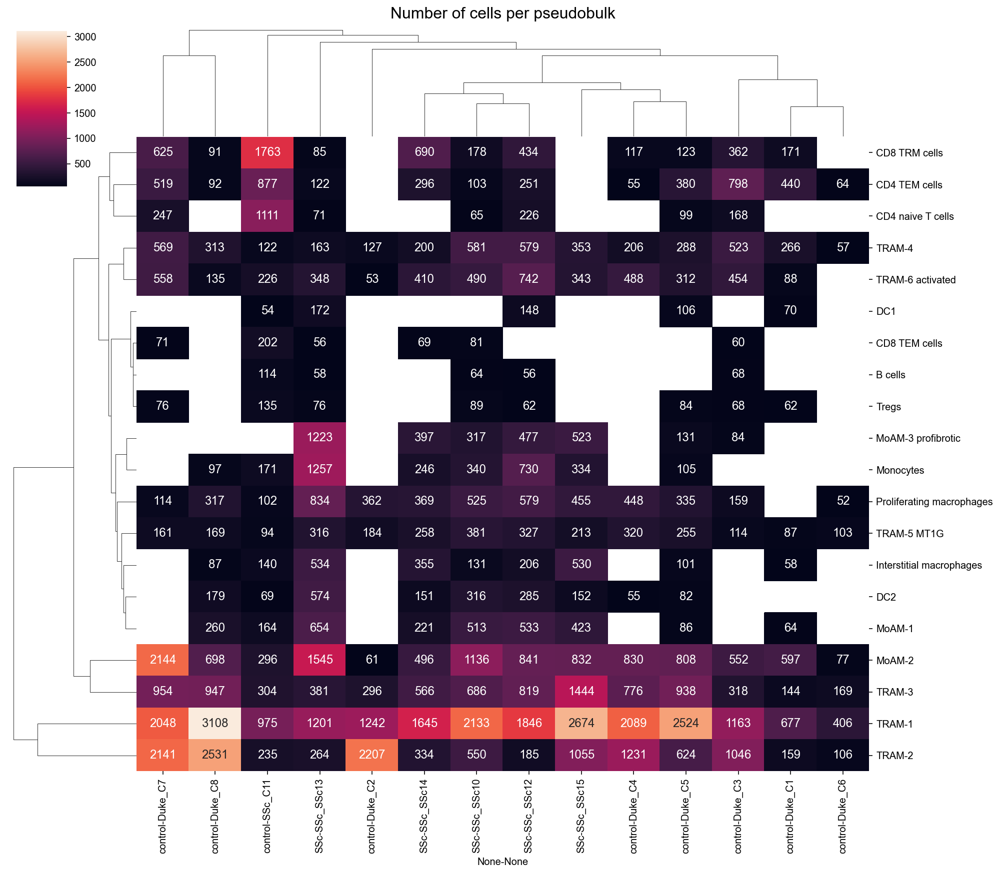

In [24]:
n_cells_per_pseudobulk = pd.DataFrame.from_dict(n_cells_data, orient="index").loc[:, ["control", "SSc"]].fillna(0)
cg = sns.clustermap(
    n_cells_per_pseudobulk,
    figsize=(14, 12),
    dendrogram_ratio=0.15,
    annot=True,
    fmt='.0f',
    annot_kws=dict(
        size=12
    ),
    mask=n_cells_per_pseudobulk == 0
)
cg.ax_col_dendrogram.set_title('Number of cells per pseudobulk', size=16);

## 1.3 Return number of samples per sex per cluster

In [25]:
rows = []
for cell_type, info in data.items():
    sex = info["meta"].Sex
    female = int((sex == "female").sum())
    male = int((sex == "male").sum())
    rows.append((cell_type, female, male))
df = pd.DataFrame(rows, columns=["cell_type", "female", "male"])
df.sort_values('cell_type')

,cell_type,female,male
0,B cells,3,2
1,CD4 TEM cells,6,6
2,CD4 naive T cells,3,4
3,CD8 TEM cells,4,2
4,CD8 TRM cells,6,5
5,DC1,3,2
6,DC2,5,4
11,Interstitial macrophages,5,4
7,MoAM-1,5,4
8,MoAM-2,8,6


## 1.4 Return number of filtered DEGs for each cluster

In [21]:
CT_ORDER = [
    'Monocytes',
    'MoAM-1',
    'MoAM-2',
    'MoAM-3 profibrotic',

    'TRAM-1',
    'TRAM-2',
    'TRAM-3',
    'TRAM-4',
    'TRAM-5 MT1G',
    'TRAM-6 activated',

    'Interstitial macrophages',
    'Proliferating macrophages',

    'CD4 TEM cells',
    'CD4 naive T cells',
    'Tregs',
    'CD8 TEM cells',
    'CD8 TRM cells',

    'DC1',
    'DC2',
    'B cells',
]

In [27]:
rows = []
for k, v in data.items():
    degs = v["filtered_degs"]
    n_degs = degs.sign.notna().sum()
    rows.append((k, n_degs))
df = pd.DataFrame(rows, columns=["name", "n_degs"])

In [28]:
df.name = pd.Categorical(df.name, categories=CT_ORDER)

In [29]:
df.sort_values("name")

,name,n_degs
10,Monocytes,343
7,MoAM-1,548
8,MoAM-2,1867
9,MoAM-3 profibrotic,697
13,TRAM-1,3883
14,TRAM-2,2316
15,TRAM-3,2970
16,TRAM-4,2513
17,TRAM-5 MT1G,1754
18,TRAM-6 activated,2533


## 1.5 Plot number of filtered DEGs for each cluster

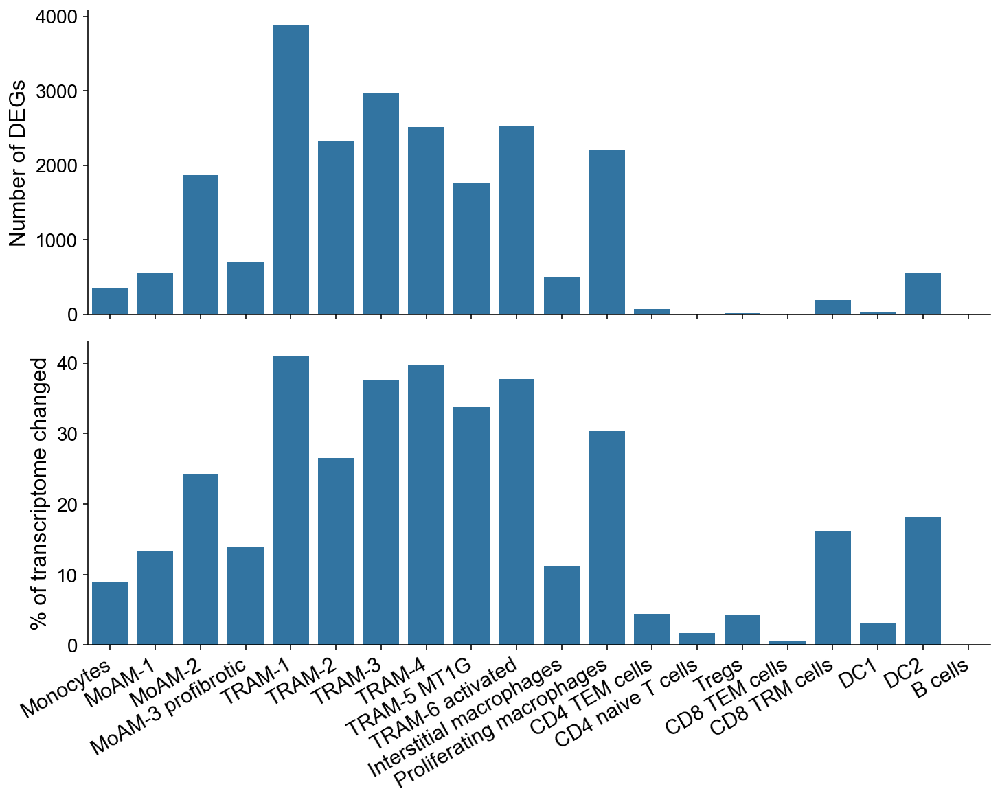

In [30]:
fig, axes = plt.subplots(figsize=(10, 8), constrained_layout=True, nrows=2, sharex=True)
ax = axes[0]
sns.barplot(
    data=df.sort_values('name'),
    y="n_degs",
    x="name",
    ax=ax,
    palette=['tab:blue']
)
ax.set_xticklabels(
    df.sort_values('name').name,
    rotation=30,
    ha="right",
    fontsize=15
)
ax.set_ylabel("Number of DEGs", fontsize=16)
ax.set_xlabel("")
ax.tick_params(axis='y', labelsize=14)
trans = mpl.transforms.Affine2D().translate(6, 0)
for t in ax.get_xticklabels():
    t.set_transform(t.get_transform() + trans)
ax.spines['top'].set_visible(None)
ax.spines['right'].set_visible(None)

ax = axes[1]
rows = []
for k, v in data.items():
    degs = v["filtered_degs"]
    n_degs = degs.sign.notna().sum() / degs.shape[0] * 100
    rows.append((k, n_degs))
df = pd.DataFrame(rows, columns=["name", "n_degs"])
df.name = pd.Categorical(df.name, categories=CT_ORDER)

sns.barplot(
    data=df.sort_values('name'),
    y="n_degs",
    x="name",
    # log=True,
    ax=ax,
    palette=['tab:blue']
)
ax.set_xticklabels(
    df.sort_values('name').name,
    rotation=30,
    ha="right",
    fontsize=15
)
ax.set_ylabel("% of transcriptome changed", fontsize=16)
ax.set_xlabel("")
ax.tick_params(axis='y', labelsize=14)
trans = mpl.transforms.Affine2D().translate(6, 0)
for t in ax.get_xticklabels():
    t.set_transform(t.get_transform() + trans)
ax.spines['top'].set_visible(None)
ax.spines['right'].set_visible(None)

fig.savefig('00_figures/Figure_2A_nDEGs_pct_DEGs.pdf')

Save table as excel with multiple sheets

In [54]:
wb = openpyxl.Workbook()
for ct in CT_ORDER:
    if ct not in data:
        continue
    info = data[ct]
    degs = info['filtered_degs']
    ws = wb.create_sheet(title=ct)
    ws.append(['gene'] + list(degs.columns))
    for i, row in degs.iterrows():
        ws.append([i] + list(row))

In [55]:
del wb['Sheet']  # remove default sheet
wb.save('00_figures/Table_S2_SSc_vs_control_all_degs.xlsx')

## 1.6 Plot number of GOs for each cluster

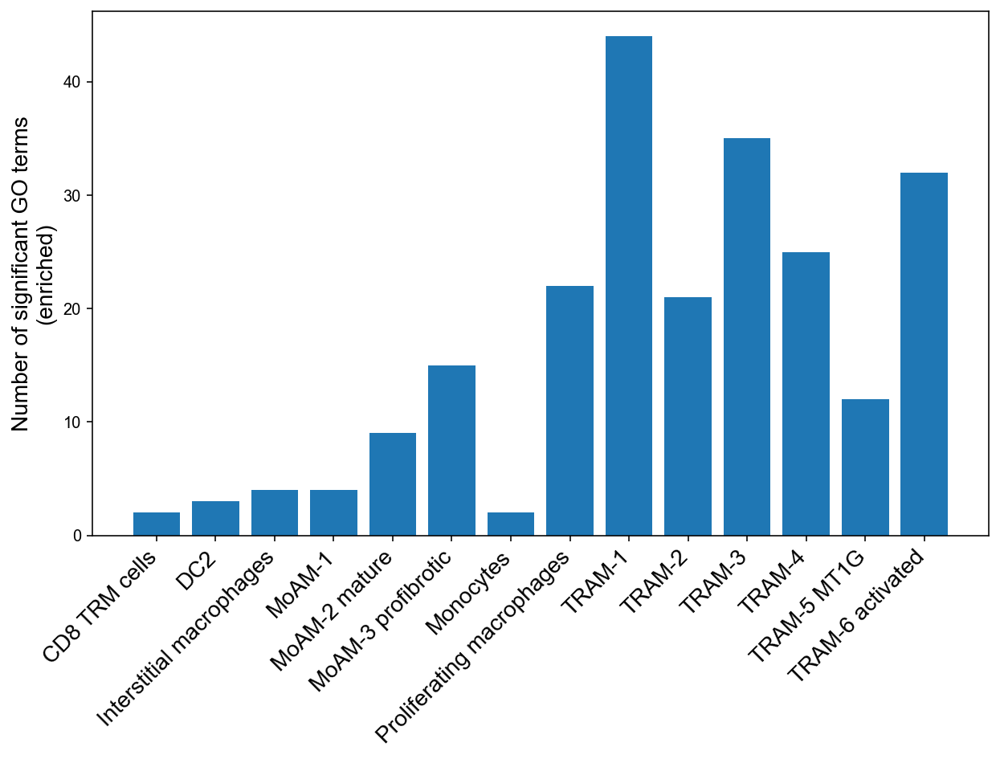

In [ ]:
n_gos = []
clusters = []
for c, i in data.items():
    n = 0
    go_upreg = i['go_control']
    if go_upreg is not None:
        n += int(go_upreg.enrichment.eq('e').sum())
    go_downreg = i['go_ssc']
    if go_downreg is not None:
        n += int(go_downreg.enrichment.eq('e').sum())

    if n > 0:
        clusters.append(c)
        n_gos.append(n)

df = pd.DataFrame(dict(name=clusters, n_gos=n_gos))
df = df.sort_values("name")

fig, ax = plt.subplots(figsize=(10, 6))
ax.bar(list(range(df.name.size)), df.n_gos)

ax.set_xticks(list(range(df.name.size)))
ax.set_xticklabels(
    df.name,
    rotation=45,
    ha="right",
    fontsize=14
)
ax.set_ylabel("Number of significant GO terms\n(enriched)", fontsize=14)

trans = mpl.transforms.Affine2D().translate(6, 0)
for t in ax.get_xticklabels():
    t.set_transform(t.get_transform() + trans)

## 1.7 Return number of GOs for each cluster

In [35]:
df

,name,n_gos
0,CD8 TRM cells,2
1,DC2,3
6,Interstitial macrophages,4
2,MoAM-1,4
3,MoAM-2 mature,9
4,MoAM-3 profibrotic,15
5,Monocytes,2
7,Proliferating macrophages,22
8,TRAM-1,44
9,TRAM-2,21


## 1.8 Plot MA for Interstitial macrophages

In [21]:
GENES_TO_HIGHLIGHT = [
    # SSc
    'CCL18',
    'CCL13',
    'NR1H3',
    'PLAUR',
    'TIMP1',
    'HBEGF',
    'LGALS1',
    'LGMN',
    'CTSL',
    'CHST11',
    # Control
    'IL7R',
    'ITGA4',
    'STAT1',
    'PTPRC',
    'IFNAR1',
]

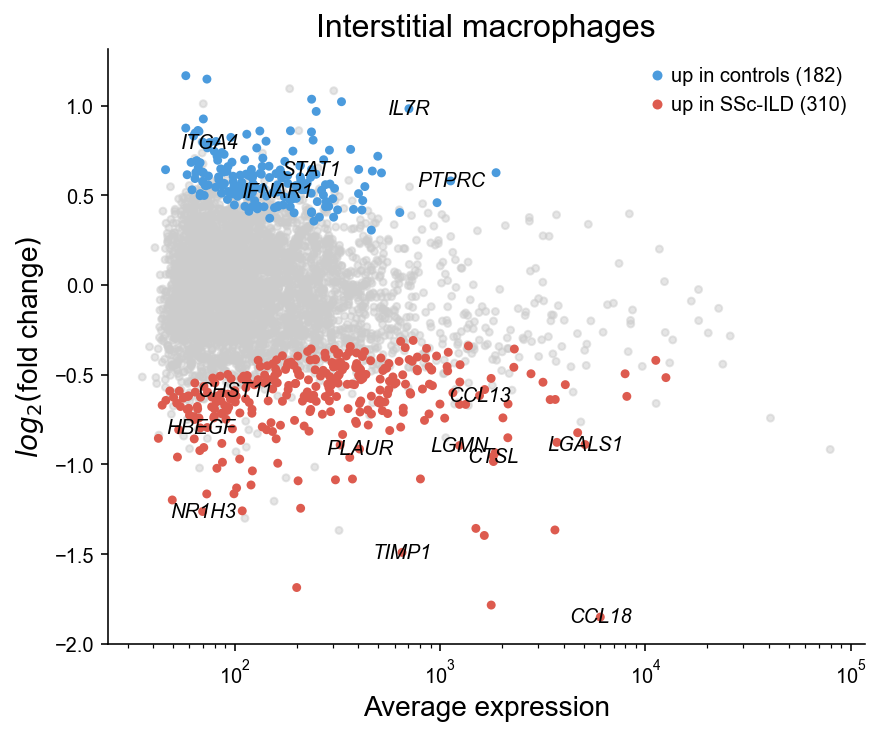

In [22]:
fig, ax = plt.subplots(constrained_layout=True, figsize=(6, 5))
all_texts = []

degs = data['Interstitial macrophages']['filtered_degs'].copy()
# degs = degs.loc[degs.index.isin(secretome.Gene)]

degs['color'] = '#cccccc'
degs['order'] = 0
degs['alpha'] = 0.5
control_idx = (
    degs.padj.lt(0.05)
    & degs.log2FoldChange.gt(0)
)
condition_idx = (
    degs.padj.lt(0.05)
    & degs.log2FoldChange.lt(0)
)
degs.loc[control_idx, 'color'] = '#4b9bdd'
degs.loc[control_idx, 'order'] = 1
degs.loc[condition_idx, 'color'] = '#dd5b4f'
degs.loc[condition_idx, 'order'] = 2
degs.loc[control_idx | condition_idx, 'alpha'] = 1
degs = degs.sort_values('order')
for alpha in degs.alpha.unique():
    idx = degs.alpha.eq(alpha)
    ax.scatter(degs.baseMean[idx], degs.log2FoldChange[idx], c=degs.color[idx], s=12, alpha=alpha)

ax.set_xscale('log')
ax.set_title('Interstitial macrophages', fontsize=16)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.tick_params(labelbottom=True)
ax.set_ylabel('$log_2($fold change$)$', size=14)
ax.set_xlabel('Average expression', size=14)
legend = []
legend.append(mpl.lines.Line2D(
    [0], [0],
    label=f'up in controls ({control_idx.sum()})',
    color='#ffffffff',
    markerfacecolor='#4b9bdd',
    marker='o',
    markersize=6
))
legend.append(mpl.lines.Line2D(
    [0], [0],
    label=f'up in SSc-ILD ({condition_idx.sum()})',
    color='#ffffffff',
    markerfacecolor='#dd5b4f',
    marker='o',
    markersize=6
))
ax.legend(handles=legend, fontsize=10, frameon=False, handletextpad=-0.3, loc='upper right', bbox_to_anchor=(1.0, 1.0))
texts = []

for gene in GENES_TO_HIGHLIGHT:
    r = degs.loc[gene]
    if pd.isna(r.sign):
        print(f"Gene {gene} not found in Interstitial macrophages DEGs, not highlighting")
        continue
    texts.append(
        ax.text(r.baseMean, r.log2FoldChange, gene, ha='center', va='center', fontstyle='italic', fontsize=10)
    )

ax.collections[0].set_rasterized(True)

fig.savefig('00_figures/Figure_S2D_im_degs.pdf', dpi=300)

# 2. Common DEGs between T cells and Macrophages

In [36]:
trams = list(filter(lambda x: x.startswith("TRAM"), data.keys()))

In [37]:
common_degs = {'control': {}, 'ssc': {}}

In [ ]:
for ct in trams:
    degs = data[ct]['filtered_degs']
    degs_control = degs.index[degs.sign.eq('Up in Control')].tolist()
    degs_ssc = degs.index[degs.sign.eq('Up in SSc')].tolist()

    if ct not in common_degs['control']:
        common_degs['control']['TRAM common'] = degs_control
    common_degs['control']['TRAM common'] = np.intersect1d(
        common_degs['control']['TRAM common'],
        degs_control
    )

    if ct not in common_degs['ssc']:
        common_degs['ssc']['TRAM common'] = degs_ssc
    common_degs['ssc']['TRAM common'] = np.intersect1d(
        common_degs['ssc']['TRAM common'],
        degs_ssc
    )

In [39]:
other_cell_types = (
    list(filter(lambda x: x.startswith("MoAM"), data.keys()))
    + ['Monocytes', 'Interstitial macrophages', 'CD4 TEM cells', 'CD8 TRM cells', 'DC2']
)

In [40]:
for ct in other_cell_types:
    degs = data[ct]['filtered_degs']
    common_degs['control'][ct] = degs.index[degs.sign.eq('Up in Control')].tolist()
    common_degs['ssc'][ct] = degs.index[degs.sign.eq('Up in SSc')].tolist()

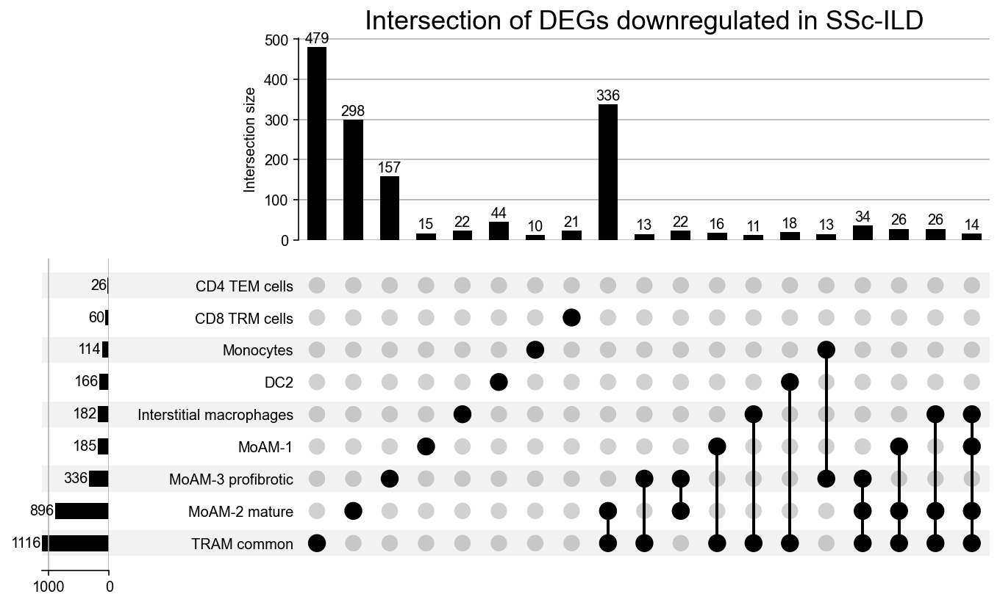

In [41]:
p = upsetplot.UpSet(
    upsetplot.from_contents(common_degs['control']),
    show_counts=True,
    min_subset_size=10
).plot()
p['intersections'].set_title('Intersection of DEGs downregulated in SSc-ILD', size=18);
p['matrix'].figure.savefig('00_figures/Figure_S3A_control_degs_overlaps.pdf')

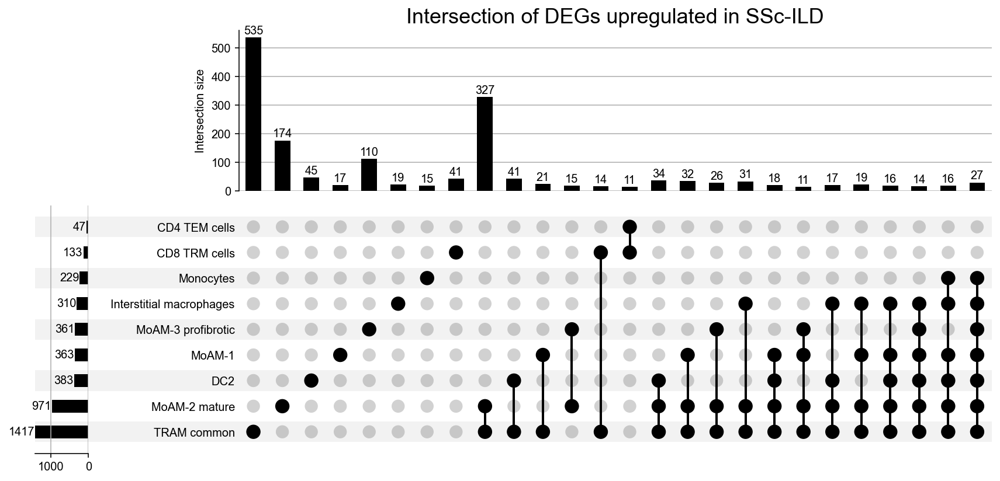

In [42]:
p = upsetplot.UpSet(
    upsetplot.from_contents(common_degs['ssc']),
    show_counts=True,
    min_subset_size=10
).plot()
p['intersections'].set_title('Intersection of DEGs upregulated in SSc-ILD', size=18);
p['matrix'].figure.savefig('00_figures/Figure_S3B_ssc_degs_overlaps.pdf')

### 2.1 T cells and TRAMs

In [ ]:
common_degs_upset = upsetplot.from_contents(common_degs['ssc']).reset_index()

In [ ]:
idx = (
    common_degs_upset['TRAM common']
    & common_degs_upset['CD8 TRM cells']
    & common_degs_upset.iloc[:, :-1].sum(axis=1).eq(2)
)
common_degs_upset.id[idx]

46      ALOX5AP
84        ARPC3
139        BTG1
264        CNBP
352       DHRS7
378         DUT
543       H3F3A
856      OCIAD1
1078      SARAF
1081     SCAND1
1095       SELT
1114       SKP1
1157      SPCS1
1256    TMEM230
Name: id, dtype: object

### 2.2 CD8 and CD4 T cells

In [ ]:
idx = (
    common_degs_upset['CD4 TEM cells']
    & common_degs_upset['CD8 TRM cells']
    & common_degs_upset.iloc[:, :-1].sum(axis=1).eq(2)
)
common_degs_upset.id[idx]

1887       B2M
1889     SEPT1
1891      IL32
1892      CCL5
1893    GIMAP4
1894      CD3D
1895      HOPX
1897    IFITM2
1898      GZMM
1899      NKG7
1900       CD7
Name: id, dtype: object

### 2.3 IM and MoAM unique genes

In [47]:
common_degs_upset_ctrl = upsetplot.from_contents(common_degs['control']).reset_index()
common_degs_upset_ssc = upsetplot.from_contents(common_degs['ssc']).reset_index()

In [63]:
def get_unique_genes(df, cell_type):
    idx = df[cell_type] & df.iloc[:, :-1].sum(axis=1).eq(1)
    return df.id[idx]

def annotate_unique_genes(df_up, df_down, cell_type):
    up = get_unique_genes(df_up, cell_type)
    down = get_unique_genes(df_down, cell_type)
    result = data[cell_type]['filtered_degs'].copy()
    result.loc[list(up) + list(down), 'unique'] = True
    return result

In [64]:
ct = 'Interstitial macrophages'
print(f'Upregulated in controls, unique to {ct}')
get_unique_genes(common_degs_upset_ctrl, ct)

Upregulated in controls, unique to Interstitial macrophages


1705       PELI1
1706       RRM2B
1708     CCDC186
1709       FARP1
1710       SHMT2
1711        GAS6
1712      FRMD4B
1713        CCZ1
1714     FAM105A
1715       DAAM1
1716        KDSR
1717    ARHGAP21
1718        POGK
1719      ZNF292
1720       KLF10
1721      TCEAL3
1722     ZC3HAV1
1723       YWHAH
1725        NCK1
1726        NASP
1727      PTGES3
1728       RNF13
Name: id, dtype: object

In [65]:
ct = 'Interstitial macrophages'
print(f'Upregulated in SSc, unique to {ct}')
get_unique_genes(common_degs_upset_ssc, ct)

Upregulated in SSc, unique to Interstitial macrophages


1863      CELF1
1865    ARHGDIA
1867      REEP3
1868     MT-ND4
1869     MYEOV2
1870      EPAS1
1871    CTDNEP1
1872      CECR1
1873      GNA12
1875      CCL13
1876      RAB20
1877     MFSD12
1878     SLC6A6
1880      SASH3
1881    ZCCHC17
1883      SGPL1
1884       PLTP
1885      ITGAX
1886      NR1H3
Name: id, dtype: object

In [68]:
annotate_unique_genes(common_degs_upset_ctrl, common_degs_upset_ssc, ct).to_csv(
    f'00_figures/11c_degs_{ct.replace(" ", "_")}.csv'
)

In [69]:
ct = 'MoAM-1'
print(f'Upregulated in controls, unique to {ct}')
get_unique_genes(common_degs_upset_ctrl, ct)

Upregulated in controls, unique to MoAM-1


1132       USP48
1134    ANKRD13A
1137       SDAD1
1140        DCP2
1144       PDS5B
1146    DYNC1LI2
1148      YTHDC1
1151      CNOT6L
1152    ARHGAP26
1157       CRTAP
1161      SCARB2
1163      EIF4A2
1164    COL4A3BP
1166        CBX3
1167       ACAP2
Name: id, dtype: object

In [70]:
ct = 'MoAM-1'
print(f'Upregulated in SSc, unique to {ct}')
get_unique_genes(common_degs_upset_ssc, ct)

Upregulated in SSc, unique to MoAM-1


1418       TBCA
1423      PCBD1
1424    CCDC85B
1427      SIVA1
1439      SNX20
1440     MAD1L1
1445      PTPRO
1446      UBAC2
1448        CSK
1458     FAM89B
1460        ID3
1461     ATXN10
1464      RRP7A
1467       GAS6
1468       CD93
1477       SQLE
1481       MATK
Name: id, dtype: object

In [71]:
annotate_unique_genes(common_degs_upset_ctrl, common_degs_upset_ssc, ct).to_csv(
    f'00_figures/11c_degs_{ct.replace(" ", "_")}.csv'
)

In [72]:
ct = 'MoAM-2 mature'
print(f'Upregulated in controls, unique to {ct}')
get_unique_genes(common_degs_upset_ctrl, ct)

Upregulated in controls, unique to MoAM-2 mature


1168    ADGRE1
1169     THBS1
1170       MME
1171     ACKR3
1172      AOC3
         ...  
1501    ZNF106
1502    LRRC57
1503      RTF1
1504     CIRBP
1507     COPB1
Name: id, Length: 298, dtype: object

In [73]:
ct = 'MoAM-2 mature'
print(f'Upregulated in SSc, unique to {ct}')
get_unique_genes(common_degs_upset_ssc, ct)

Upregulated in SSc, unique to MoAM-2 mature


1484        SNX5
1485    TMEM183A
1487        RIT1
1488      PTPN18
1489      DCAF13
          ...   
1698        ICA1
1700        EGR1
1701     CLEC10A
1702        TNS1
1704       CXCL5
Name: id, Length: 174, dtype: object

In [74]:
annotate_unique_genes(common_degs_upset_ctrl, common_degs_upset_ssc, ct).to_csv(
    f'00_figures/11c_degs_{ct.replace(" ", "_")}.csv'
)

In [75]:
ct = 'MoAM-3 profibrotic'
print(f'Upregulated in controls, unique to {ct}')
get_unique_genes(common_degs_upset_ctrl, ct)

Upregulated in controls, unique to MoAM-3 profibrotic


1508       IFI27
1510    TMEM176A
1511       NUPR1
1512     TNFSF10
1513         AXL
          ...   
1684      PPP1CC
1685      MYCBP2
1686       CECR1
1688     SLCO2B1
1689         UBB
Name: id, Length: 157, dtype: object

In [76]:
ct = 'MoAM-3 profibrotic'
print(f'Upregulated in SSc, unique to {ct}')
get_unique_genes(common_degs_upset_ssc, ct)

Upregulated in SSc, unique to MoAM-3 profibrotic


1709     EIF4G2
1710       GNB1
1711      MBNL1
1712    HNRNPA3
1714     DPYSL2
         ...   
1835      MAPK6
1836      FNIP2
1837       THBD
1838      ALCAM
1839     CLEC5A
Name: id, Length: 110, dtype: object

In [77]:
annotate_unique_genes(common_degs_upset_ctrl, common_degs_upset_ssc, ct).to_csv(
    f'00_figures/11c_degs_{ct.replace(" ", "_")}.csv'
)

# 3. TRAM common DEGs and GOs in V3 chemistry

## 3.1 TRAM common DEGs

In [22]:
trams = list(filter(lambda x: x.startswith("TRAM"), data.keys()))

In [23]:
tram_degs = {'control': {}, 'ssc': {}}
for ct in trams:
    degs = data[ct]['filtered_degs']
    tram_degs['control'][ct] = degs.index[degs.sign.eq('Up in Control')].tolist()
    tram_degs['ssc'][ct] = degs.index[degs.sign.eq('Up in SSc')].tolist()

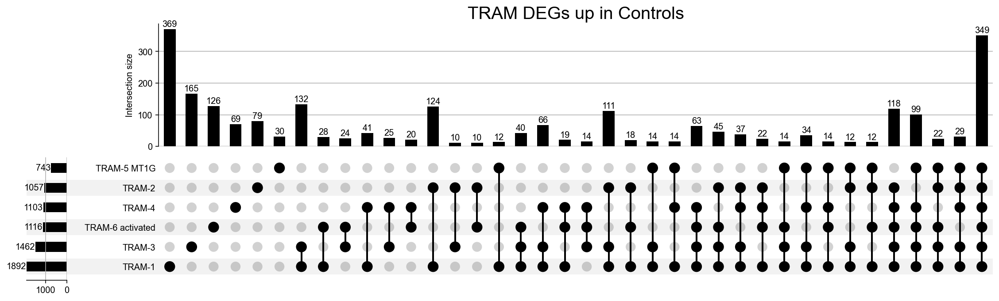

In [24]:
p = upsetplot.UpSet(
    upsetplot.from_contents(tram_degs['control']),
    show_counts=True,
    min_subset_size=10
).plot()
p['intersections'].set_title('TRAM DEGs up in Controls', size=20);

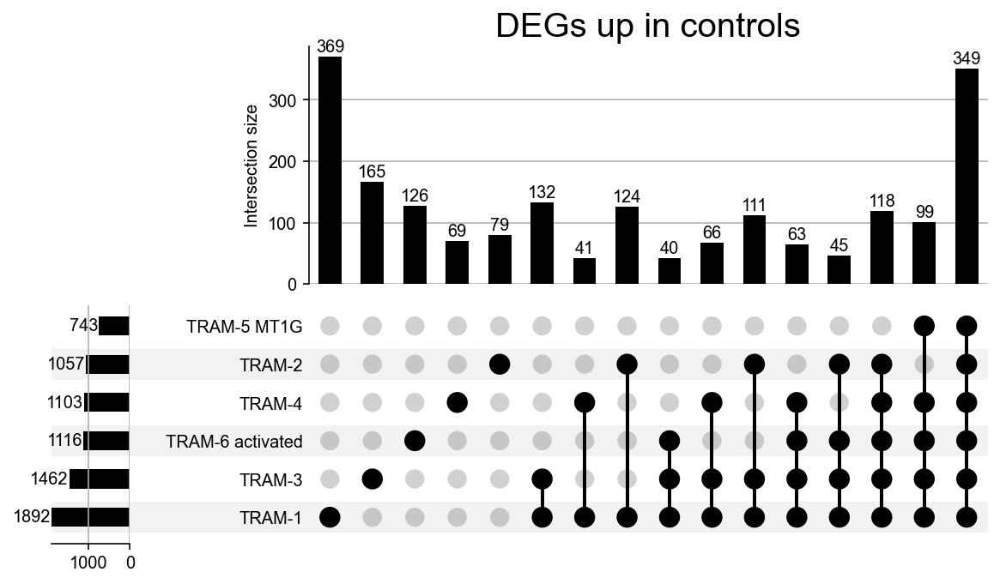

In [26]:
p = upsetplot.UpSet(
    upsetplot.from_contents(tram_degs['control']),
    show_counts=True,
    min_subset_size=40
).plot()
p['intersections'].set_title('DEGs up in controls', size=20);
p['matrix'].figure.savefig('00_figures/Figure_S2A_tram_control_overlap.pdf')

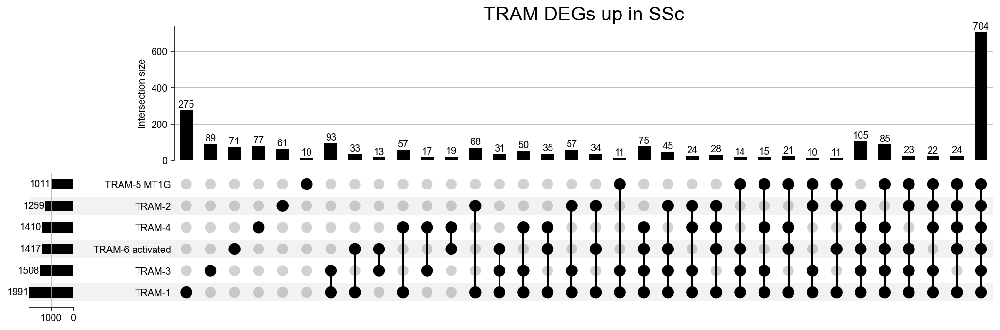

In [27]:
p = upsetplot.UpSet(
    upsetplot.from_contents(tram_degs['ssc']),
    show_counts=True,
    min_subset_size=10
).plot()
p['intersections'].set_title('TRAM DEGs up in SSc', size=20);

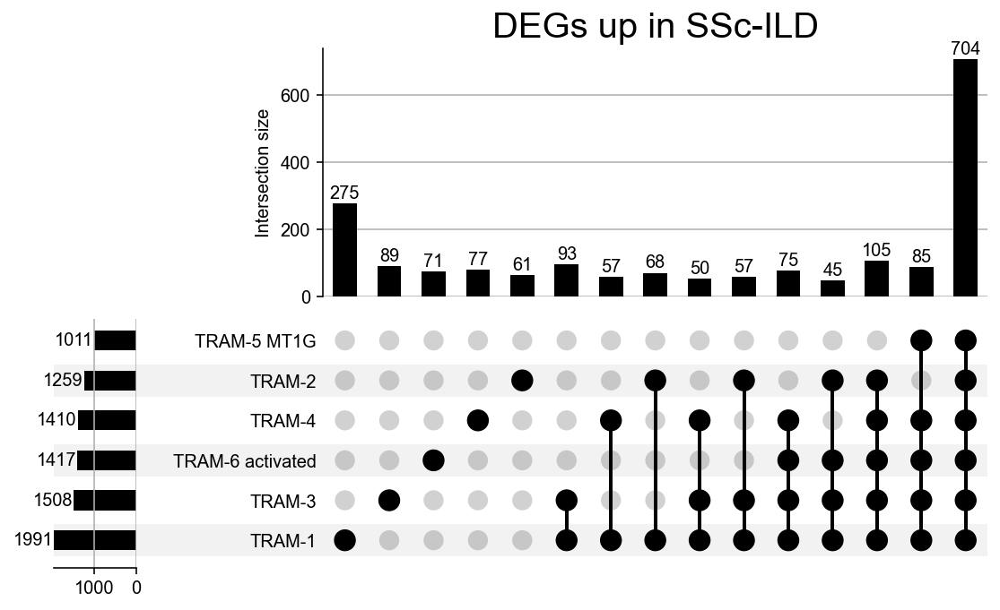

In [28]:
p = upsetplot.UpSet(
    upsetplot.from_contents(tram_degs['ssc']),
    show_counts=True,
    min_subset_size=40
).plot()
p['intersections'].set_title('DEGs up in SSc-ILD', size=20);
p['matrix'].figure.savefig('00_figures/Figure_S2A_tram_ssc_overlap.pdf')

In [30]:
tram_common_hc_degs = collections.Counter()
tram_common_ssc_degs = collections.Counter()
for ct in trams:
    degs = data[ct]['filtered_degs']
    tram_common_hc_degs.update(degs.index[degs.sign.eq('Up in Control')].tolist())
    tram_common_ssc_degs.update(degs.index[degs.sign.eq('Up in SSc')].tolist())

In [31]:
analysis_base = DEG_DIR / '__analysis'

In [32]:
os.makedirs(analysis_base, exist_ok=True)

In [33]:
all_tram_hc_degs = [g for g, c in tram_common_hc_degs.items() if c == 6]
with open(analysis_base / '01_tram_all_hc_degs.txt', 'w') as f:
    f.write('\n'.join(all_tram_hc_degs))

In [34]:
all_tram_ssc_degs = [g for g, c in tram_common_ssc_degs.items() if c == 6]
with open(analysis_base / '01_tram_all_ssc_degs.txt', 'w') as f:
    f.write('\n'.join(all_tram_ssc_degs))

### Save TRAM-1 specific DEGs

In [57]:
upsetplot.from_contents(tram_degs['control'])

id
TRAM-1 TRAM-2 TRAM-3 TRAM-4 TRAM-5 MT1G TRAM-6 activated         
True   False  False  False  False       True                 RGS1
                                        False               HMHA1
                                        False               LPAR3
       True   False  False  True        True               KCNAB1
       False  False  False  False       False                FBN1
...                                                           ...
False  False  False  False  False       True              HNRNPH3
                                        True                DDX24
                                        True                CNOT4
                                        True                 STX7
                                        True                 RBMX

[2544 rows x 1 columns]

In [58]:
tram_degs_upset = upsetplot.from_contents(tram_degs['control'])
# Tram-1 is 1st in index for some reason
tram_degs_upset.loc[(True, False, False, False, False, False)].to_csv(
    analysis_base / '01_tram_1_hc_exclusive_degs.csv'
)
tram_degs_upset = upsetplot.from_contents(tram_degs['ssc'])
# Tram-1 is 2nd in index for some reason
tram_degs_upset.loc[(True, False, False, False, False, False)].to_csv(
    analysis_base / '01_tram_1_ssc_exclusive_degs.csv'
)

<ipython-input-58-06761abf8c71>:3: PerformanceWarning: indexing past lexsort depth may impact performance.
  tram_degs_upset.loc[(True, False, False, False, False, False)].to_csv(
<ipython-input-58-06761abf8c71>:8: PerformanceWarning: indexing past lexsort depth may impact performance.
  tram_degs_upset.loc[(True, False, False, False, False, False)].to_csv(


## 3.2 TRAM common differentially-expressed TFs

In [59]:
tram_tfs = {'control': {}, 'ssc': {}}
for ct in trams:
    degs = data[ct]['filtered_degs']
    tram_tfs['control'][ct] = degs.index[degs.sign.eq('Up in Control') & degs.index.isin(TFS)].tolist()
    tram_tfs['ssc'][ct] = degs.index[degs.sign.eq('Up in SSc') & degs.index.isin(TFS)].tolist()

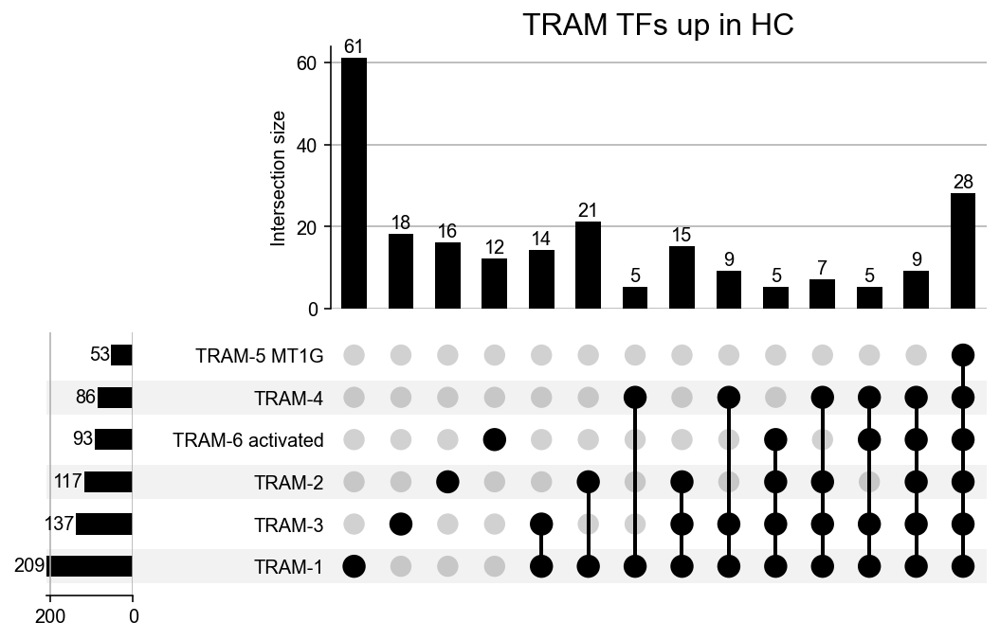

In [60]:
p = upsetplot.UpSet(
    upsetplot.from_contents(tram_tfs['control']),
    show_counts=True,
    min_subset_size=5
).plot()
p["intersections"].set_title("TRAM TFs up in HC", size=16);

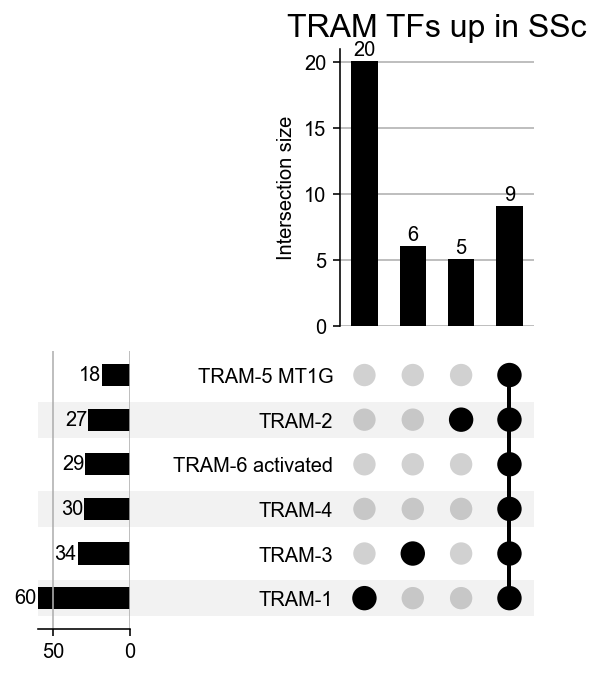

In [61]:
p = upsetplot.UpSet(
    upsetplot.from_contents(tram_tfs['ssc']),
    show_counts=True,
    min_subset_size=5
).plot()
p["intersections"].set_title("TRAM TFs up in SSc", size=16);

In [62]:
tram_common_hc_tfs = collections.Counter()
tram_common_ssc_tfs = collections.Counter()
for ct in trams:
    degs = data[ct]["filtered_degs"]
    tram_common_hc_tfs.update(degs.index[degs.sign.eq("Up in Control") & degs.index.isin(TFS)].tolist())
    tram_common_ssc_tfs.update(degs.index[degs.sign.eq("Up in SSc") & degs.index.isin(TFS)].tolist())

In [63]:
all_tram_hc_tfs = [g for g, c in tram_common_hc_tfs.items() if c == 6]
with open(analysis_base / '01_tram_all_hc_tfs.txt', 'w') as f:
    f.write('\n'.join(all_tram_hc_tfs))

In [64]:
all_tram_ssc_tfs = [g for g, c in tram_common_ssc_tfs.items() if c == 6]
with open(analysis_base / '01_tram_all_ssc_tfs.txt', 'w') as f:
    f.write('\n'.join(all_tram_ssc_tfs))

## 3.3 TRAM common GOs

In [65]:
tram_gos = {"control": {}, "ssc": {}}
for ct in trams:
    tram_gos["control"][ct] = data[ct]["go_control"]["# GO"]
    tram_gos["ssc"][ct] = data[ct]["go_ssc"]["# GO"]

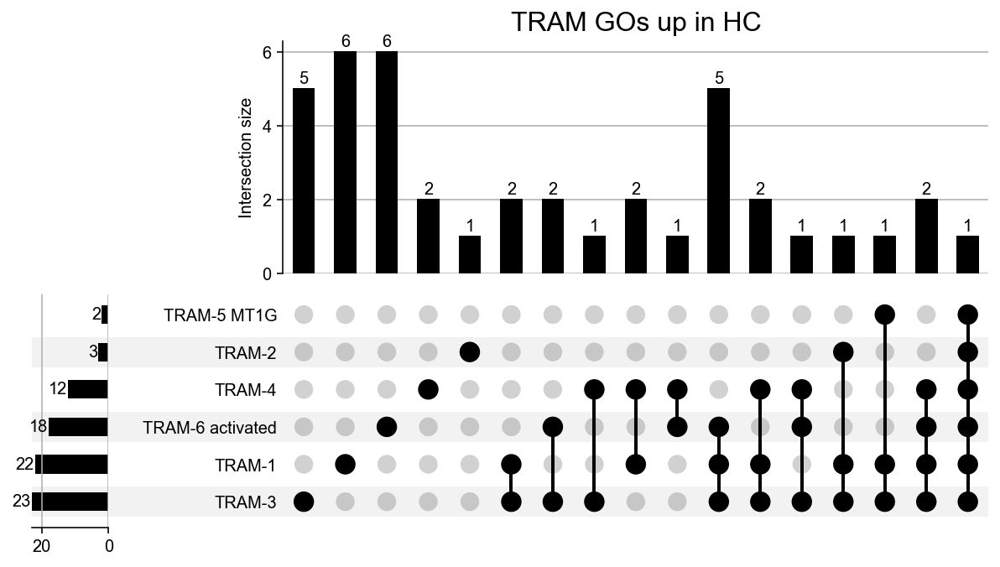

In [66]:
p = upsetplot.UpSet(
    upsetplot.from_contents(tram_gos["control"]),
    show_counts=True
).plot()
p["intersections"].set_title("TRAM GOs up in HC", size=16);

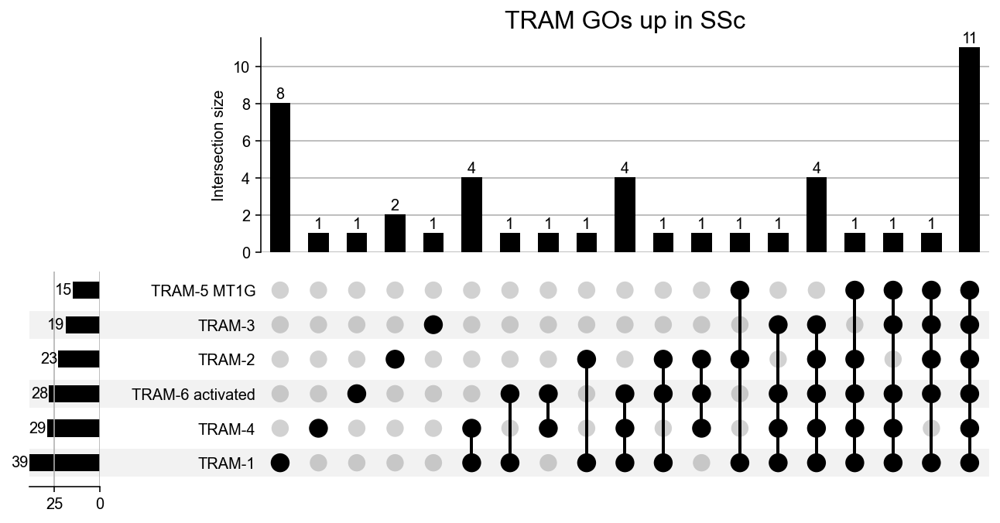

In [67]:
p = upsetplot.UpSet(
    upsetplot.from_contents(tram_gos["ssc"]),
    show_counts=True
).plot()
p["intersections"].set_title("TRAM GOs up in SSc", size=16);

Let's look at the 11 common GOs for SSc

In [68]:
common_ssc_gos = upsetplot.from_contents(tram_gos["ssc"]).loc[(True,) * 6].id.values

<ipython-input-68-5dd49ac568aa>:1: PerformanceWarning: indexing past lexsort depth may impact performance.
  common_ssc_gos = upsetplot.from_contents(tram_gos["ssc"]).loc[(True,) * 6].id.values


In [69]:
df = data['TRAM-1']['go_ssc']
df.loc[df['# GO'].isin(common_ssc_gos)]

,# GO,enrichment,name,ratio_in_study,ratio_in_pop,depth,p_fdr_bh,study_items
0,GO:0032543,e,mitochondrial translation,64/1968,90/9359,8,1.607469e-20,"AURKAIP1, CHCHD1, DAP3, GADD45GIP1, GATB, ICT1..."
1,GO:0042776,e,proton motive force-driven mitochondrial ATP s...,41/1968,63/9359,13,1.470882e-10,"ATP5A1, ATP5B, ATP5C1, ATP5D, ATP5F1, ATP5H, A..."
2,GO:0009060,e,aerobic respiration,39/1968,66/9359,6,3.121262e-08,"ADSL, ATP5D, BLOC1S1, MDH2, ME3, NDUFA11, NDUF..."
3,GO:0032981,e,mitochondrial respiratory chain complex I asse...,35/1968,60/9359,7,4.739664e-07,"BCS1L, COA1, ECSIT, NDUFA11, NDUFA12, NDUFA2, ..."
6,GO:0006120,e,"mitochondrial electron transport, NADH to ubiq...",26/1968,45/9359,8,7.383031e-05,"DNAJC15, NDUFA2, NDUFA4, NDUFA5, NDUFA6, NDUFA..."
7,GO:0045333,e,cellular respiration,21/1968,33/9359,5,1.209295e-04,"CHCHD5, COX4I1, COX5A, COX5B, COX6A1, COX6B1, ..."
8,GO:1902600,e,proton transmembrane transport,39/1968,83/9359,7,1.376657e-04,"ATP5A1, ATP5B, ATP5C1, ATP5D, ATP5F1, ATP5G1, ..."
12,GO:0098869,e,cellular oxidant detoxification,20/1968,38/9359,3,8.138413e-03,"ALOX5AP, GPX1, GPX4, GSTK1, GSTO1, GSTP1, GSTZ..."
22,GO:0006357,p,regulation of transcription by RNA polymerase II,66/1968,773/9359,9,1.370877e-18,"ABT1, ACTB, AK6, ANXA4, ARID5B, BBS7, BCL7C, C..."
23,GO:0045944,p,positive regulation of transcription by RNA po...,68/1968,656/9359,10,2.835694e-10,"AK6, ANXA2, APEX1, ARF4, C14orf166, CAMK1, CDK..."


## 3.4 Which GO processes are enriched in common DEGs for TRAMs?

In [35]:
go_upreg = run_go(
    all_tram_hc_degs,
    data["TRAM-1"]["filtered_degs"].index
)

**NOTE: DEFAULT TAXID STORED FROM gene2go IS 9606 (human)

HMS:0:00:43.721375 346,070 annotations, 20,758 genes, 18,733 GOs, 1 taxids READ: gene2go 

Load BP Gene Ontology Analysis ...
fisher module not installed.  Falling back on scipy.stats.fisher_exact


**No GOs**

In [36]:
go_downreg = run_go(
    all_tram_ssc_degs,
    data["TRAM-1"]["filtered_degs"].index
)

**NOTE: DEFAULT TAXID STORED FROM gene2go IS 9606 (human)

HMS:0:00:41.678247 346,070 annotations, 20,758 genes, 18,733 GOs, 1 taxids READ: gene2go 

Load BP Gene Ontology Analysis ...
fisher module not installed.  Falling back on scipy.stats.fisher_exact
     21 items WROTE: __go_temp_file


In [37]:
go_downreg

,# GO,enrichment,name,ratio_in_study,ratio_in_pop,depth,p_fdr_bh,study_items
0,GO:0042776,e,proton motive force-driven mitochondrial ATP s...,35/701,63/9359,13,1.473536e-19,"ATP5A1, ATP5B, ATP5C1, ATP5D, ATP5F1, ATP5H, A..."
1,GO:0009060,e,aerobic respiration,31/701,66/9359,6,1.708176e-14,"ADSL, ATP5D, MDH2, NDUFA11, NDUFA12, NDUFA6, N..."
2,GO:0032543,e,mitochondrial translation,34/701,90/9359,8,1.023729e-12,"AURKAIP1, GADD45GIP1, ICT1, MRPL11, MRPL13, MR..."
3,GO:1902600,e,proton transmembrane transport,30/701,83/9359,7,1.757127e-10,"ATP5A1, ATP5B, ATP5C1, ATP5D, ATP5F1, ATP5G1, ..."
4,GO:0006120,e,"mitochondrial electron transport, NADH to ubiq...",21/701,45/9359,8,2.266539e-09,"DNAJC15, NDUFA4, NDUFA6, NDUFA8, NDUFA9, NDUFA..."
5,GO:0045333,e,cellular respiration,17/701,33/9359,5,3.668459e-08,"CHCHD5, COX4I1, COX5A, COX5B, COX6A1, COX6B1, ..."
6,GO:0032981,e,mitochondrial respiratory chain complex I asse...,22/701,60/9359,7,1.532152e-07,"NDUFA11, NDUFA12, NDUFA6, NDUFA8, NDUFA9, NDUF..."
7,GO:0015986,e,proton motive force-driven ATP synthesis,11/701,21/9359,12,7.286800e-05,"ATP5A1, ATP5B, ATP5C1, ATP5D, ATP5F1, ATP5G1, ..."
8,GO:0006123,e,"mitochondrial electron transport, cytochrome c...",10/701,18/9359,8,1.155469e-04,"COX4I1, COX5A, COX5B, COX6A1, COX6B1, COX6C, C..."
9,GO:0006412,e,translation,20/701,76/9359,7,3.778970e-04,"AIMP2, COPS5, MRPL11, MRPL13, MRPL18, MRPL22, ..."


In [38]:
go_downreg.to_csv(os.path.join(analysis_base, '02_tram-all_ssc_go.csv'))

In [39]:
len(all_tram_ssc_degs)

704

In [40]:
pd.Series(all_tram_ssc_degs).isin(data["TRAM-1"]["filtered_degs"].index).sum()

704

In [41]:
go_downreg.loc[go_downreg.enrichment.eq('e')].to_csv('00_figures/Table_S4_tram_common_go.csv', index=False)

In [48]:
go_downreg.loc[go_downreg.enrichment.eq('e')].shape

(18, 8)

### GO barplots

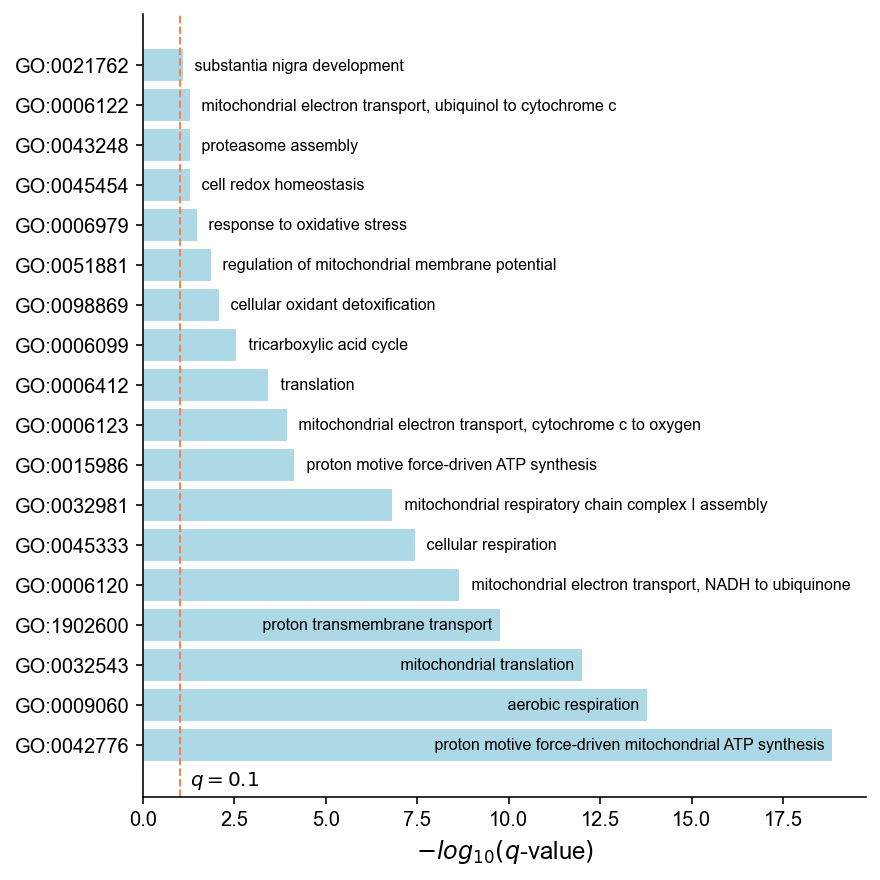

In [47]:
go_to_plot = go_downreg.loc[go_downreg.enrichment.eq('e')].copy()
fig, ax = plt.subplots(figsize=(6, 6), constrained_layout=True)
ax.barh(
    range(go_to_plot.shape[0]),
    -np.log10(go_to_plot.p_fdr_bh),
    color=go_to_plot.enrichment.replace({
        'e': 'lightblue',
        'p': 'dimgray'
    })
)
ax.axvline(x=-np.log10(0.1), c='coral', ls='--', lw=1)
ax.annotate(
    '$q=0.1$',
    (-np.log10(0.1), -0.6),
    xytext=(10, 0),
    textcoords='offset pixels',
    va='top'
)
ax.set_yticks(list(range(go_to_plot.shape[0])))
ax.set_yticklabels(go_to_plot['# GO']);
ax.set_xlabel('$-log_{10}(q$-value$)$', size=12)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
for i, (_, row) in enumerate(go_to_plot.iterrows()):
    name = ''
    char_limit = 60
    for word in row['name'].split():
        if len(name) + len(word) + 1 > char_limit:
            name += '…'
            break
        name += f' {word}'
    x_coord = -np.log10(row.p_fdr_bh)
    if x_coord > 9:
        ax.text(x_coord - 0.2, i, name, ha='right', va='center', fontsize=8)
    else:
        ax.text(x_coord + 0.2, i, name, va='center', fontsize=8)
# ax.legend(
#     handles=[
#         mpl.patches.Patch(color='dimgray', label='Depleted'),
#         mpl.patches.Patch(color='lightblue', label='Enriched')
#     ],
#     loc='upper right',
#     bbox_to_anchor=(1, 0.8),
#     title='Direction'
# )
fig.savefig('00_figures/Figure_S2B_common_tram_degs_go.pdf')

## 3.5 Print and plot GO for MoAM-1 and MoAM-2

In [53]:
data['MoAM-1']['filtered_degs'].sign.value_counts()

Up in SSc        363
Up in Control    185
Name: sign, dtype: int64

In [55]:
data['MoAM-1']['go_ssc']

,# GO,enrichment,name,ratio_in_study,ratio_in_pop,depth,p_fdr_bh,study_items
0,GO:1902600,e,proton transmembrane transport,19/361,61/4060,7,0.004492,"ATP5B, ATP5D, ATP5G1, ATP5G3, ATP5I, ATP5J, AT..."
1,GO:0006123,e,"mitochondrial electron transport, cytochrome c...",9/361,16/4060,8,0.007584,"COX5A, COX5B, COX6B1, COX6C, COX7A2, COX7B, CO..."
2,GO:0045333,e,cellular respiration,11/361,28/4060,5,0.030363,"COX5A, COX5B, COX6B1, COX6C, COX7A2, COX7B, CO..."
3,GO:0042776,e,proton motive force-driven mitochondrial ATP s...,17/361,62/4060,13,0.030363,"ATP5B, ATP5D, ATP5I, ATP5J, ATP5O, NDUFA11, ND..."


In [56]:
data['MoAM-2']['filtered_degs'].sign.value_counts()

Up in SSc        971
Up in Control    896
Name: sign, dtype: int64

In [57]:
data['MoAM-2']['go_ssc']

,# GO,enrichment,name,ratio_in_study,ratio_in_pop,depth,p_fdr_bh,study_items
0,GO:0042776,e,proton motive force-driven mitochondrial ATP s...,28/965,63/7627,13,0.000003,"ATP5A1, ATP5B, ATP5C1, ATP5D, ATP5F1, ATP5H, A..."
1,GO:1902600,e,proton transmembrane transport,29/965,75/7627,7,0.000043,"ATP5A1, ATP5B, ATP5C1, ATP5D, ATP5F1, ATP5G1, ..."
2,GO:0009060,e,aerobic respiration,25/965,61/7627,6,0.000077,"ADSL, ATP5D, BLOC1S1, MDH2, NDUFA11, NDUFA12, ..."
3,GO:0045333,e,cellular respiration,16/965,32/7627,5,0.000720,"CHCHD5, COX4I1, COX5A, COX5B, COX6A1, COX6B1, ..."
4,GO:0032543,e,mitochondrial translation,28/965,87/7627,8,0.002667,"AURKAIP1, GADD45GIP1, ICT1, MRPL11, MRPL13, MR..."
5,GO:0006123,e,"mitochondrial electron transport, cytochrome c...",10/965,17/7627,8,0.012763,"COX4I1, COX5A, COX5B, COX6A1, COX6B1, COX6C, C..."
6,GO:0015986,e,proton motive force-driven ATP synthesis,11/965,21/7627,12,0.017176,"ATP5A1, ATP5B, ATP5C1, ATP5D, ATP5F1, ATP5G1, ..."
7,GO:0006120,e,"mitochondrial electron transport, NADH to ubiq...",16/965,45/7627,8,0.077647,"DNAJC15, NDUFA4, NDUFA6, NDUFA9, NDUFAB1, NDUF..."
8,GO:0036261,e,7-methylguanosine cap hypermethylation,6/965,8/7627,9,0.090998,"SNRPD1, SNRPD2, SNRPD3, SNRPE, SNRPF, SNRPG"


In [68]:
go_to_plot = data['MoAM-1']['go_ssc'].copy()
go_to_plot['cell_type'] = 'MoAM-1'
go_to_plot = pd.concat([
    data['MoAM-2']['go_ssc'].assign(cell_type='MoAM-2'),
    go_to_plot,
])
go_to_plot.reset_index(inplace=True, drop=True)
go_to_plot

,# GO,enrichment,name,ratio_in_study,ratio_in_pop,depth,p_fdr_bh,study_items,cell_type
0,GO:0042776,e,proton motive force-driven mitochondrial ATP s...,28/965,63/7627,13,0.000003,"ATP5A1, ATP5B, ATP5C1, ATP5D, ATP5F1, ATP5H, A...",MoAM-2
1,GO:1902600,e,proton transmembrane transport,29/965,75/7627,7,0.000043,"ATP5A1, ATP5B, ATP5C1, ATP5D, ATP5F1, ATP5G1, ...",MoAM-2
2,GO:0009060,e,aerobic respiration,25/965,61/7627,6,0.000077,"ADSL, ATP5D, BLOC1S1, MDH2, NDUFA11, NDUFA12, ...",MoAM-2
3,GO:0045333,e,cellular respiration,16/965,32/7627,5,0.000720,"CHCHD5, COX4I1, COX5A, COX5B, COX6A1, COX6B1, ...",MoAM-2
4,GO:0032543,e,mitochondrial translation,28/965,87/7627,8,0.002667,"AURKAIP1, GADD45GIP1, ICT1, MRPL11, MRPL13, MR...",MoAM-2
5,GO:0006123,e,"mitochondrial electron transport, cytochrome c...",10/965,17/7627,8,0.012763,"COX4I1, COX5A, COX5B, COX6A1, COX6B1, COX6C, C...",MoAM-2
6,GO:0015986,e,proton motive force-driven ATP synthesis,11/965,21/7627,12,0.017176,"ATP5A1, ATP5B, ATP5C1, ATP5D, ATP5F1, ATP5G1, ...",MoAM-2
7,GO:0006120,e,"mitochondrial electron transport, NADH to ubiq...",16/965,45/7627,8,0.077647,"DNAJC15, NDUFA4, NDUFA6, NDUFA9, NDUFAB1, NDUF...",MoAM-2
8,GO:0036261,e,7-methylguanosine cap hypermethylation,6/965,8/7627,9,0.090998,"SNRPD1, SNRPD2, SNRPD3, SNRPE, SNRPF, SNRPG",MoAM-2
9,GO:1902600,e,proton transmembrane transport,19/361,61/4060,7,0.004492,"ATP5B, ATP5D, ATP5G1, ATP5G3, ATP5I, ATP5J, AT...",MoAM-1


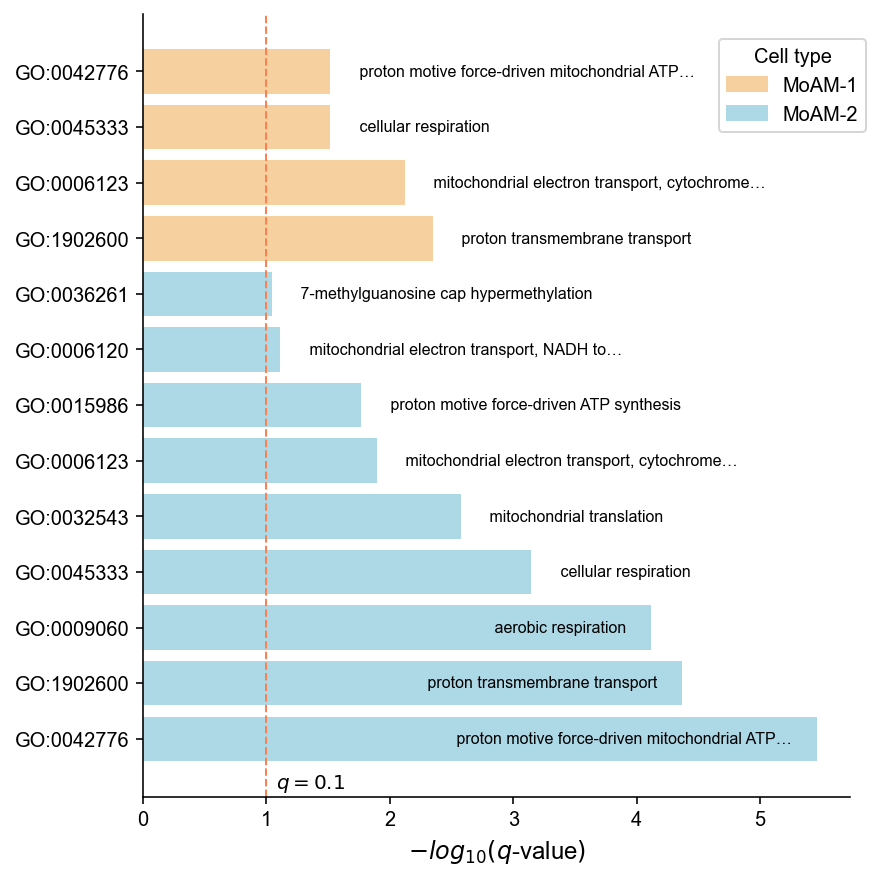

In [96]:
fig, ax = plt.subplots(figsize=(6, 6), constrained_layout=True)
ax.barh(
    range(go_to_plot.shape[0]),
    -np.log10(go_to_plot.p_fdr_bh),
    color=go_to_plot.cell_type.replace({
        'MoAM-1': '#f7d0a0',
        'MoAM-2': 'lightblue'
    })
)
ax.axvline(x=-np.log10(0.1), c='coral', ls='--', lw=1)
ax.annotate(
    '$q=0.1$',
    (-np.log10(0.1), -0.6),
    xytext=(10, 0),
    textcoords='offset pixels',
    va='top'
)
# ax.yaxis.set_inverted(True)
ax.set_yticks(list(range(go_to_plot.shape[0])))
ax.set_yticklabels(go_to_plot['# GO']);
ax.set_xlabel('$-log_{10}(q$-value$)$', size=12)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
for i, (_, row) in enumerate(go_to_plot.iterrows()):
    name = ''
    char_limit = 45
    for word in row['name'].split():
        if len(name) + len(word) + 1 > char_limit:
            name += '…'
            break
        name += f' {word}'
    x_coord = -np.log10(row.p_fdr_bh)
    if x_coord > 4:
        ax.text(x_coord - 0.2, i, name, ha='right', va='center', fontsize=8)
    else:
        ax.text(x_coord + 0.2, i, name, va='center', fontsize=8)
ax.legend(
    handles=[
        mpl.patches.Patch(color='#f7d0a0', label='MoAM-1'),
        mpl.patches.Patch(color='lightblue', label='MoAM-2')
    ],
    loc='upper left',
    bbox_to_anchor=(0.8, 0.98),
    title='Cell type'
)
fig.savefig('00_figures/Figure_S2C_moam1-2_go.pdf')

## 3.6 Which cell types are enriched for IFN type 1/2 response?

Take all genes in cell type, and run GSEA on them in preranked log2FC list

In [73]:
ifn_gene_sets = {
    'HALLMARK_INTERFERON_ALPHA_RESPONSE': HALLMARK_IFN_ALPHA_R,
    'HALLMARK_INTERFERON_GAMMA_RESPONSE': HALLMARK_IFN_GAMMA_R,
}

In [74]:
res = []
for ct, info in data.items():
    try:
        gsea_res = gseapy.prerank(
            info['filtered_degs'].log2FoldChange,
            gene_sets=ifn_gene_sets,
            seed=1066,
            permutation_num=10_000
        )
    except:
        continue
    gsea_res.res2d.insert(1, 'Cell type', ct)
    res.append(gsea_res.res2d)
res = pd.concat(res)

Significant enrichments

In [ ]:
res.loc[
    res['FDR q-val'].lt(0.05),
    ['Cell type', 'Term', 'NES', 'FDR q-val', 'Tag %', 'Gene %', 'Lead_genes']
]

,Cell type,Term,NES,FDR q-val,Tag %,Gene %,Lead_genes
0,DC2,HALLMARK_INTERFERON_ALPHA_RESPONSE,2.51637,0,19/45,13.25%,IFI44L;PARP14;IRF7;MX1;IFI44;IRF1;EPSTI1;IFITM...
1,DC2,HALLMARK_INTERFERON_GAMMA_RESPONSE,2.00571,0.000253357,21/89,5.39%,IFI44L;P2RY14;STAT1;MX2;MTHFD2;RNF213;XAF1;PAR...
0,MoAM-1,HALLMARK_INTERFERON_ALPHA_RESPONSE,2.29966,0,24/55,14.85%,IRF1;LGALS3BP;IFI44L;GBP2;EPSTI1;PARP14;IFIT3;...
1,MoAM-1,HALLMARK_INTERFERON_GAMMA_RESPONSE,2.10428,0,51/109,22.63%,APOL6;JAK2;STAT1;IRF1;LGALS3BP;IFI44L;EPSTI1;V...
0,MoAM-2 mature,HALLMARK_INTERFERON_ALPHA_RESPONSE,1.68703,0.00258095,30/85,19.91%,GBP4;IFI27;LGALS3BP;DDX60;IFI44L;IFIT3;NCOA7;S...
1,MoAM-2 mature,HALLMARK_INTERFERON_GAMMA_RESPONSE,1.48137,0.0116143,42/152,16.45%,SERPING1;CD274;GBP4;IFI27;STAT1;JAK2;LGALS3BP;...
0,MoAM-3 profibrotic,HALLMARK_INTERFERON_ALPHA_RESPONSE,2.91922,0,46/66,11.99%,IFI27;LGALS3BP;IFI44L;PSMB9;IFIT2;GBP2;SAMD9L;...
1,MoAM-3 profibrotic,HALLMARK_INTERFERON_GAMMA_RESPONSE,2.77152,0,64/120,14.33%,SERPING1;IFI27;LGALS3BP;TNFSF10;STAT1;IFI44L;P...
0,Monocytes,HALLMARK_INTERFERON_ALPHA_RESPONSE,2.81777,0,29/54,11.33%,LGALS3BP;SAMD9L;EIF2AK2;IFIT3;IFI44L;EPSTI1;IR...
1,Monocytes,HALLMARK_INTERFERON_GAMMA_RESPONSE,2.22735,0,42/106,11.33%,LGALS3BP;SAMD9L;STAT1;APOL6;EIF2AK2;IFIT3;IFI4...


# 4. Heatmaps

We take pseudobulk as average $log(\text{10k-norm} + 1)$ gene counts per sample per cell type, and plot the DEGs in a heatmap

## 4.1 All DEGs from all cell types

1. Collect all DEGs

In [76]:
all_degs = []
for ct, info in data.items():
    degs = info['filtered_degs']
    all_degs.append(degs.index[degs.sign.notna()].tolist())
all_degs = functools.reduce(np.union1d, all_degs)

In [77]:
all_degs.size

5708

2. Take pseudobulks

In [78]:
metadata_df = ds_processed.obs.loc[
    ds_processed.obs.Chemistry.eq("10x 3' V3")
][
    ['External Sample ID', 'cell_type', 'Status']
].drop_duplicates(subset=['External Sample ID', 'cell_type'])

In [79]:
pseudobulk = np.zeros((metadata_df.shape[0], all_degs.size))
gene_idx = ds_processed.raw.var_names.isin(all_degs)
gene_names = ds_processed.raw.var_names[gene_idx]
for i, (_, metadata_row) in enumerate(metadata_df.iterrows()):
    metadata_idx = (
        ds_processed.obs.cell_type.eq(metadata_row.cell_type)
        & ds_processed.obs['External Sample ID'].eq(metadata_row['External Sample ID'])
    )
    pseudobulk[i, :] = ds_processed.raw.X[metadata_idx][:, gene_idx].mean(axis=0)

In [80]:
pseudobulk = pd.DataFrame(pseudobulk, index=metadata_df.index, columns=gene_names)

In [81]:
metadata_df.Status = pd.Categorical(metadata_df.Status, categories=['control', 'SSc'])

Z-score pseudobulk

In [82]:
pseudobulk = ((pseudobulk - pseudobulk.mean(axis=0)) / pseudobulk.std(axis=0))

In [83]:
col_colors_df = get_color_annotations(metadata_df, {
    'cell_type': sc.plotting.palettes.default_28,
    'Status': [(0.3, 0.4, 0.9), (0.9, 0.3, 0.3)],
    'External Sample ID': 'tab20'
})

In [84]:
sample_order = metadata_df.sort_values(
    ['cell_type', 'Status', 'External Sample ID']
).index

In [85]:
legend_handles = {}
for l in ('cell_type',):
    legend_handles[l] = []
    labels = metadata_df[[l]].drop_duplicates().sort_values(l)
    colors = col_colors_df.loc[labels.index, l]
    for label, color in zip(labels[l], colors):
        legend_handles[l].append(mpl.patches.Patch(
            label=label,
            color=color
        ))

/projects/b1038/Pulmonary/nmarkov/ssc-v2/code/venv/lib/python3.9/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


Text(0.5, 1.0, 'Pseudobulk expression of 5708 DEGs for all cell types')

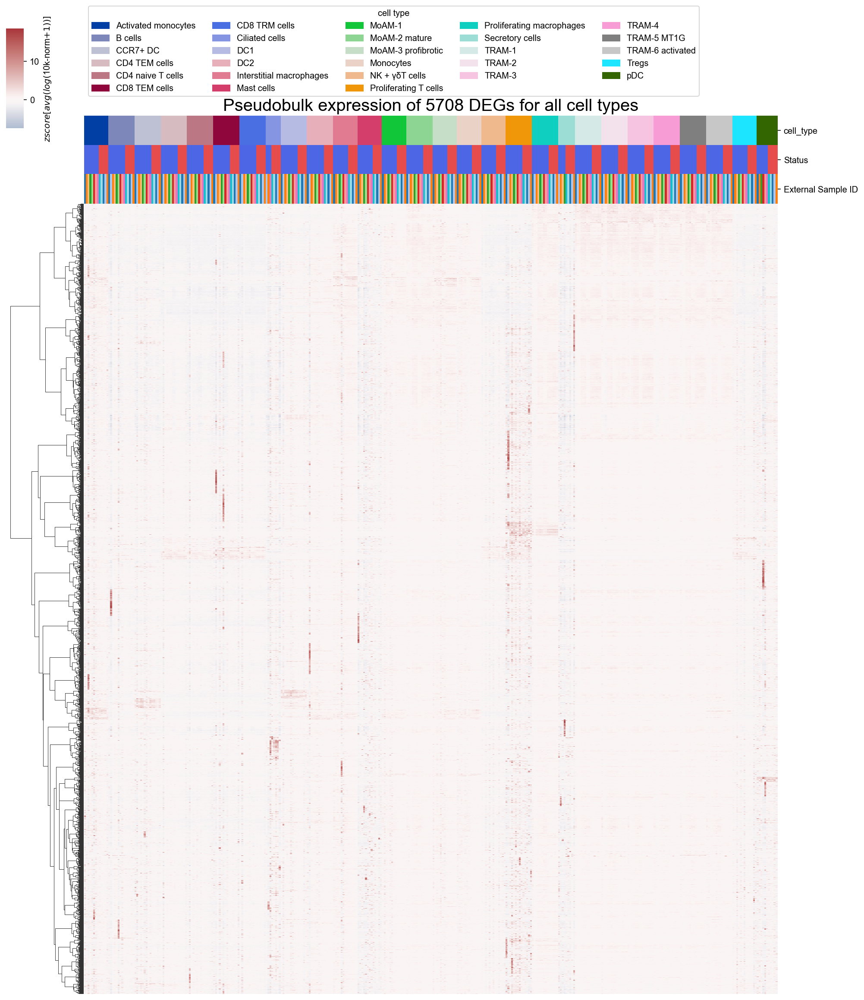

In [ ]:
cg = sns.clustermap(
    pseudobulk.loc[sample_order].T,
    figsize=(14, 16),
    method='ward',
    col_cluster=False,
    col_colors=col_colors_df.loc[sample_order],
    yticklabels=[],
    xticklabels=[],
    cmap='vlag',
    center=0,
    cbar_kws={'label': '$zscore[avg(log($10k-norm$ + 1))]$'},
    cbar_pos=(0.01, 0.88, 0.02, 0.1),
    dendrogram_ratio=0.1
)
cg.ax_col_colors.tick_params(left=False, labelleft=False, right=True, labelright=True)
cg.ax_col_colors.legend(
    handles=legend_handles['cell_type'],
    title='cell type',
    ncol=5,
    loc='upper left',
    bbox_to_anchor=(0, 2.3)
)
cg.ax_col_colors.set_title(
    f'Pseudobulk expression of {all_degs.size} DEGs for all cell types',
    size=20
)

Text(0.5, 1.0, 'Pseudobulk expression of 5708 DEGs for all cell types')

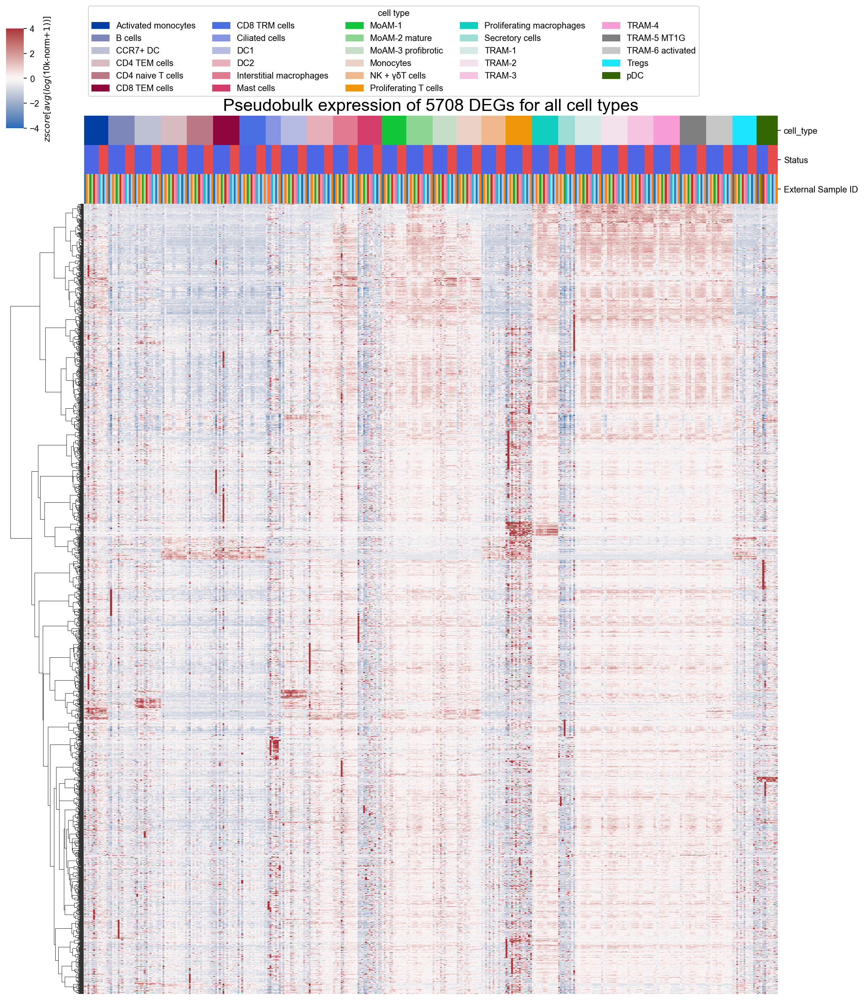

In [ ]:
cg = sns.clustermap(
    pseudobulk.loc[sample_order].T,
    figsize=(14, 16),
    method='ward',
    col_cluster=False,
    col_colors=col_colors_df.loc[sample_order],
    yticklabels=[],
    xticklabels=[],
    cmap='vlag',
    center=0,
    vmin=-4,
    vmax=4,
    cbar_kws={'label': '$zscore[avg(log($10k-norm$ + 1))]$'},
    cbar_pos=(0.01, 0.88, 0.02, 0.1),
    dendrogram_ratio=0.1
)
cg.ax_col_colors.tick_params(left=False, labelleft=False, right=True, labelright=True)
cg.ax_col_colors.legend(
    handles=legend_handles['cell_type'],
    title='cell type',
    ncol=5,
    loc='upper left',
    bbox_to_anchor=(0, 2.3)
)
cg.ax_col_colors.set_title(
    f'Pseudobulk expression of {all_degs.size} DEGs for all cell types',
    size=20
)

In [88]:
rows = []
for k, v in data.items():
    degs = v["filtered_degs"]
    n_degs = degs.sign.notna().sum()
    rows.append((k, n_degs))
df = pd.DataFrame(rows, columns=["name", "n_degs"])

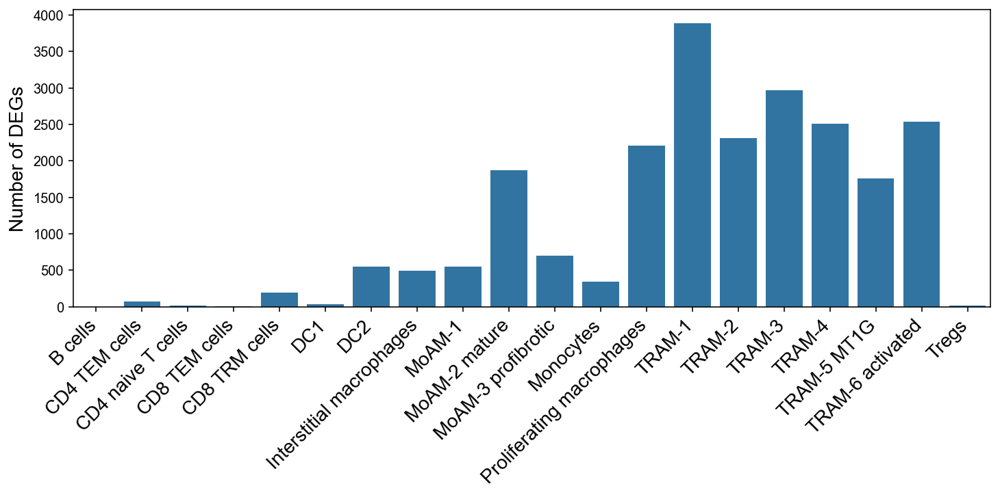

In [ ]:
fig, ax = plt.subplots(figsize=(12, 4))
sns.barplot(
    data=df.sort_values('name'),
    y="n_degs",
    x="name",
    ax=ax,
    palette=['tab:blue']
)
ax.set_xticklabels(
    df.sort_values('name').name,
    rotation=45,
    ha="right",
    fontsize=14
)
ax.set_ylabel("Number of DEGs", fontsize=14)
ax.set_xlabel("")
trans = mpl.transforms.Affine2D().translate(6, 0)
for t in ax.get_xticklabels():
    t.set_transform(t.get_transform() + trans)

Based on the above, let's plot the heatmap for certain cell types only

## 4.2 All DEGs from selected cell types

In [90]:
deg_cell_types = [
    'MoAM-2 mature', 'Proliferating macrophages', 'TRAM-1',
    'TRAM-2', 'TRAM-3', 'TRAM-4', 'TRAM-5 MT1G', 'TRAM-6 activated'
]

1. Collect all DEGs

In [91]:
all_degs = []
for ct, info in data.items():
    if ct not in deg_cell_types:
        continue
    degs = info['filtered_degs']
    all_degs.append(degs.index[degs.sign.notna()].tolist())
all_degs = functools.reduce(np.union1d, all_degs)

In [92]:
all_degs.size

5321

2. Take pseudobulks

In [93]:
metadata_df = ds_processed.obs.loc[
    ds_processed.obs.Chemistry.eq("10x 3' V3")
    & ds_processed.obs.cell_type.isin(deg_cell_types)
][
    ['External Sample ID', 'cell_type', 'Status']
].drop_duplicates(subset=['External Sample ID', 'cell_type'])

In [94]:
pseudobulk = np.zeros((metadata_df.shape[0], all_degs.size))
gene_idx = ds_processed.raw.var_names.isin(all_degs)
gene_names = ds_processed.raw.var_names[gene_idx]
for i, (_, metadata_row) in enumerate(metadata_df.iterrows()):
    metadata_idx = (
        ds_processed.obs.cell_type.eq(metadata_row.cell_type)
        & ds_processed.obs['External Sample ID'].eq(metadata_row['External Sample ID'])
    )
    pseudobulk[i, :] = ds_processed.raw.X[metadata_idx][:, gene_idx].mean(axis=0)

In [95]:
pseudobulk.shape

(112, 5321)

In [96]:
pseudobulk = pd.DataFrame(pseudobulk, index=metadata_df.index, columns=gene_names)

Z-score pseudobulk

In [97]:
pseudobulk = ((pseudobulk - pseudobulk.mean(axis=0)) / pseudobulk.std(axis=0))

In [98]:
metadata_df.Status = pd.Categorical(metadata_df.Status, categories=['control', 'SSc'])

In [99]:
metadata_df.cell_type = metadata_df.cell_type.astype(str)

In [100]:
col_colors_df = get_color_annotations(metadata_df, {
    'cell_type': 'Dark2',
    'Status': [(0.3, 0.4, 0.9), (0.9, 0.3, 0.3)],
    'External Sample ID': 'tab20'
})

In [101]:
sample_order = metadata_df.sort_values(
    ['cell_type', 'Status', 'External Sample ID']
).index

In [102]:
legend_handles = {}
for l in ('cell_type',):
    legend_handles[l] = []
    labels = metadata_df[[l]].drop_duplicates().sort_values(l)
    colors = col_colors_df.loc[labels.index, l]
    for label, color in zip(labels[l], colors):
        legend_handles[l].append(mpl.patches.Patch(
            label=label,
            color=color
        ))

/projects/b1038/Pulmonary/nmarkov/ssc-v2/code/venv/lib/python3.9/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


Text(0.5, 1.0, 'Pseudobulk expression of 5321 DEGs for selected cell types')

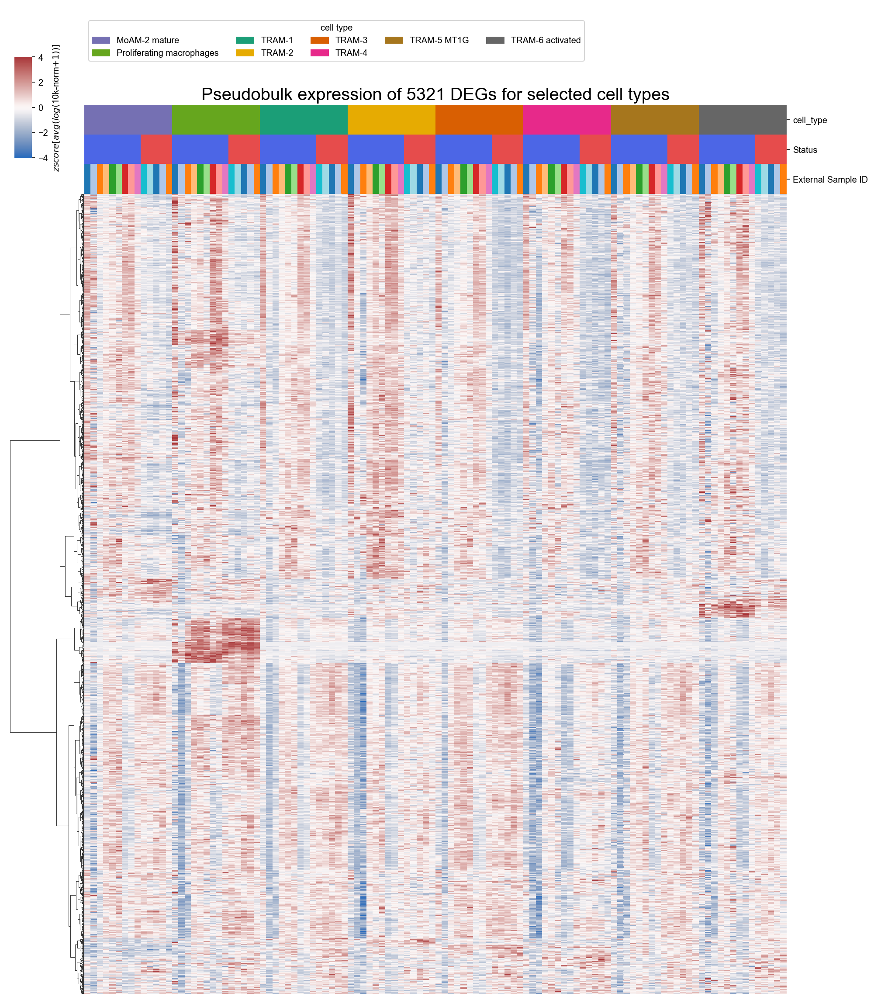

In [ ]:
cg = sns.clustermap(
    pseudobulk.loc[sample_order].T,
    figsize=(14, 16),
    method='ward',
    col_cluster=False,
    col_colors=col_colors_df.loc[sample_order],
    yticklabels=[],
    xticklabels=[],
    cmap='vlag',
    center=0,
    vmin=-4,
    vmax=4,
    cbar_kws={'label': '$zscore[avg(log($10k-norm$ + 1))]$'},
    cbar_pos=(0.02, 0.84, 0.02, 0.1),
    dendrogram_ratio=0.1,
)
cg.ax_col_colors.tick_params(left=False, labelleft=False, right=True, labelright=True)
cg.ax_col_colors.legend(
    handles=legend_handles['cell_type'],
    title='cell type',
    ncol=5,
    loc='upper left',
    bbox_to_anchor=(0, 2)
)
cg.ax_col_colors.set_title(
    f'Pseudobulk expression of {all_degs.size} DEGs for selected cell types',
    size=20
)

In [104]:
sample_order = metadata_df.sort_values(
    ['Status', 'cell_type', 'External Sample ID']
).index

Text(0.5, 1.0, 'Pseudobulk expression of 5321 DEGs for selected cell types\nordered by control/SSc')

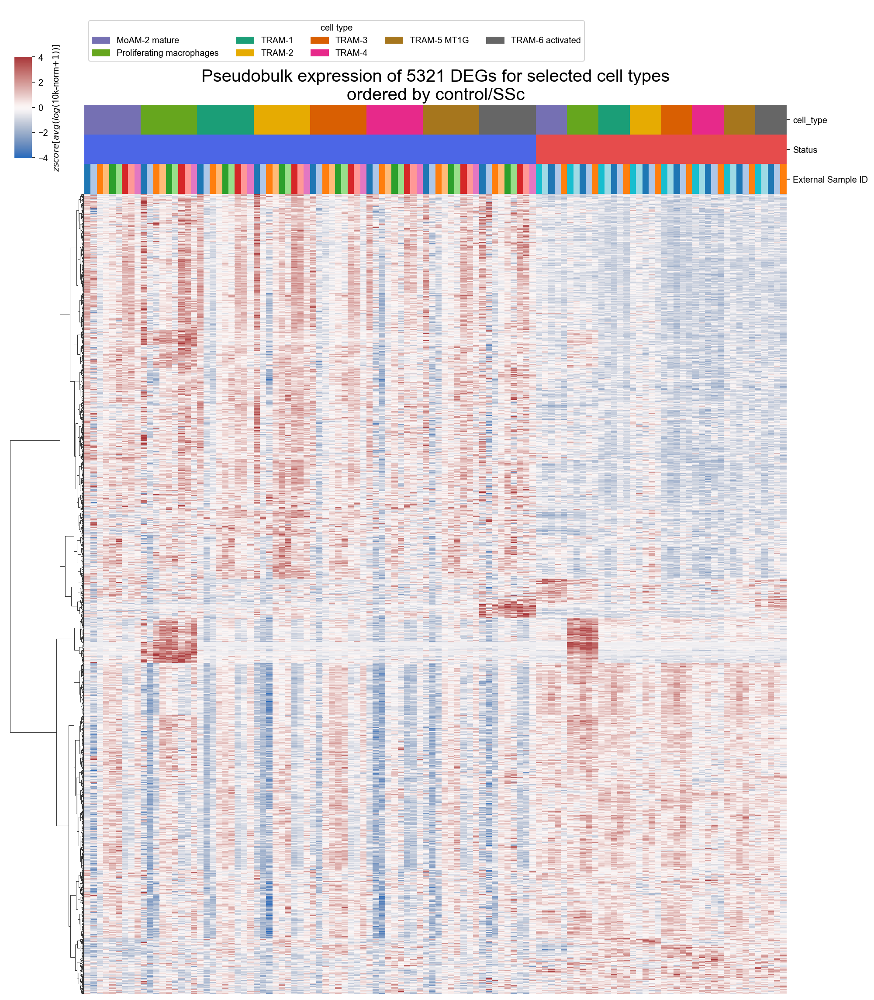

In [ ]:
cg = sns.clustermap(
    pseudobulk.loc[sample_order].T,
    figsize=(14, 16),
    method='ward',
    col_cluster=False,
    col_colors=col_colors_df.loc[sample_order],
    yticklabels=[],
    xticklabels=[],
    cmap='vlag',
    center=0,
    vmin=-4,
    vmax=4,
    cbar_kws={'label': '$zscore[avg(log($10k-norm$ + 1))]$'},
    cbar_pos=(0.02, 0.84, 0.02, 0.1),
    dendrogram_ratio=0.1,
)
cg.ax_col_colors.tick_params(left=False, labelleft=False, right=True, labelright=True)
cg.ax_col_colors.legend(
    handles=legend_handles['cell_type'],
    title='cell type',
    ncol=5,
    loc='upper left',
    bbox_to_anchor=(0, 2)
)
cg.ax_col_colors.set_title(
    f'Pseudobulk expression of {all_degs.size} DEGs for selected cell types\n'
    'ordered by control/SSc',
    size=20
)

In [106]:
all_degs_data = []
for ct, info in data.items():
    if ct not in deg_cell_types:
        continue
    degs = info['filtered_degs']
    all_degs_data.append(degs.loc[degs.sign.notna()])
all_degs_data = pd.concat(all_degs_data, axis=0)

In [107]:
all_degs_data['lfc_abs'] = all_degs_data.log2FoldChange.abs()

In [108]:
all_degs_data = all_degs_data.sort_values('lfc_abs', ascending=False).reset_index().rename(
    columns={'index': 'gene'}
).groupby('gene').head(1)

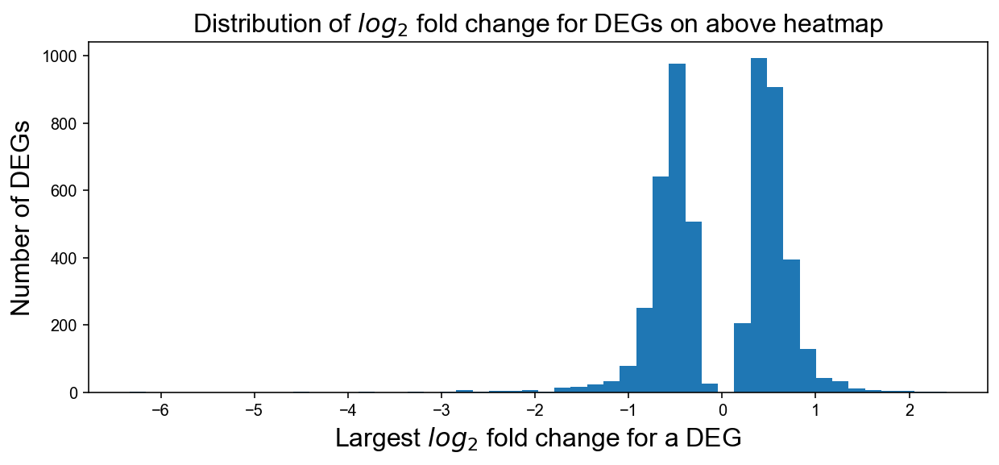

In [109]:
fig, ax = plt.subplots(figsize=(10, 4))
ax.hist(all_degs_data.log2FoldChange, bins=50)
ax.set_xlabel('Largest $log_2$ fold change for a DEG', size=16)
ax.set_ylabel('Number of DEGs', size=16)
ax.set_title('Distribution of $log_2$ fold change for DEGs on above heatmap', size=16)
ax.xaxis.set_major_locator(mpl.ticker.MultipleLocator(1))

## 4.3 All TF DEGs from selected cell types

In [110]:
all_tfs = np.intersect1d(all_degs, TFS)

In [111]:
all_tfs.size

375

2. Take pseudobulks

In [112]:
metadata_df = ds_processed.obs.loc[
    ds_processed.obs.Chemistry.eq("10x 3' V3")
    & ds_processed.obs.cell_type.isin(deg_cell_types)
][
    ['External Sample ID', 'cell_type', 'Status']
].drop_duplicates(subset=['External Sample ID', 'cell_type'])

In [113]:
pseudobulk = np.zeros((metadata_df.shape[0], all_tfs.size))
gene_idx = ds_processed.raw.var_names.isin(all_tfs)
gene_names = ds_processed.raw.var_names[gene_idx]
for i, (_, metadata_row) in enumerate(metadata_df.iterrows()):
    metadata_idx = (
        ds_processed.obs.cell_type.eq(metadata_row.cell_type)
        & ds_processed.obs['External Sample ID'].eq(metadata_row['External Sample ID'])
    )
    pseudobulk[i, :] = ds_processed.raw.X[metadata_idx][:, gene_idx].mean(axis=0)

In [114]:
pseudobulk.shape

(112, 375)

In [115]:
pseudobulk = pd.DataFrame(pseudobulk, index=metadata_df.index, columns=gene_names)

Z-score pseudobulk

In [116]:
pseudobulk = ((pseudobulk - pseudobulk.mean(axis=0)) / pseudobulk.std(axis=0))

In [117]:
metadata_df.Status = pd.Categorical(metadata_df.Status, categories=['control', 'SSc'])

In [118]:
metadata_df.cell_type = metadata_df.cell_type.astype(str)

In [119]:
col_colors_df = get_color_annotations(metadata_df, {
    'cell_type': 'Dark2',
    'Status': [(0.3, 0.4, 0.9), (0.9, 0.3, 0.3)],
    'External Sample ID': 'tab20'
})

In [120]:
sample_order = metadata_df.sort_values(
    ['cell_type', 'Status', 'External Sample ID']
).index

In [121]:
legend_handles = {}
for l in ('cell_type',):
    legend_handles[l] = []
    labels = metadata_df[[l]].drop_duplicates().sort_values(l)
    colors = col_colors_df.loc[labels.index, l]
    for label, color in zip(labels[l], colors):
        legend_handles[l].append(mpl.patches.Patch(
            label=label,
            color=color
        ))

Text(0.5, 1.0, 'Pseudobulk expression of 375 TF DEGs for selected cell types')

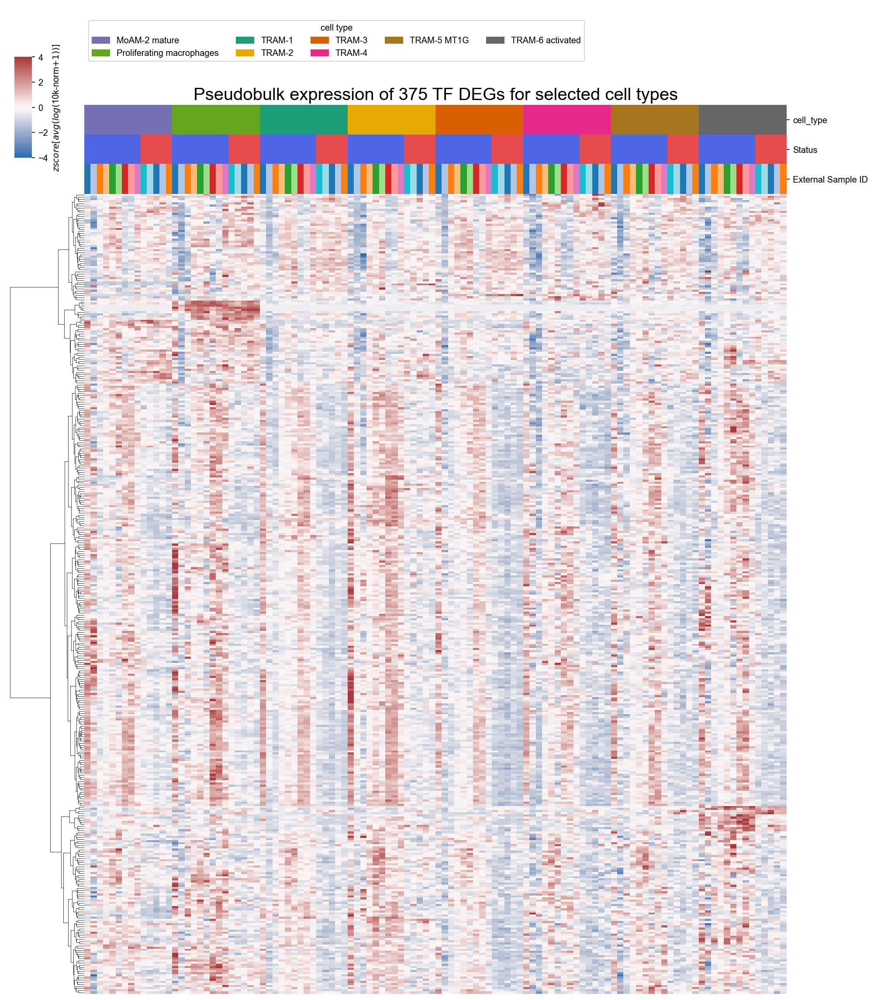

In [ ]:
cg = sns.clustermap(
    pseudobulk.loc[sample_order].T,
    figsize=(14, 16),
    method='ward',
    col_cluster=False,
    col_colors=col_colors_df.loc[sample_order],
    yticklabels=[],
    xticklabels=[],
    cmap='vlag',
    center=0,
    vmin=-4,
    vmax=4,
    cbar_kws={'label': '$zscore[avg(log($10k-norm$ + 1))]$'},
    cbar_pos=(0.02, 0.84, 0.02, 0.1),
    dendrogram_ratio=0.1,
)
cg.ax_col_colors.tick_params(left=False, labelleft=False, right=True, labelright=True)
cg.ax_col_colors.legend(
    handles=legend_handles['cell_type'],
    title='cell type',
    ncol=5,
    loc='upper left',
    bbox_to_anchor=(0, 2)
)
cg.ax_col_colors.set_title(
    f'Pseudobulk expression of {all_tfs.size} TF DEGs for selected cell types',
    size=20
)

In [123]:
sample_order = metadata_df.sort_values(
    ['Status', 'cell_type', 'External Sample ID']
).index

Text(0.5, 1.0, 'Pseudobulk expression of 375 TF DEGs for selected cell types\nordered by control/SSc')

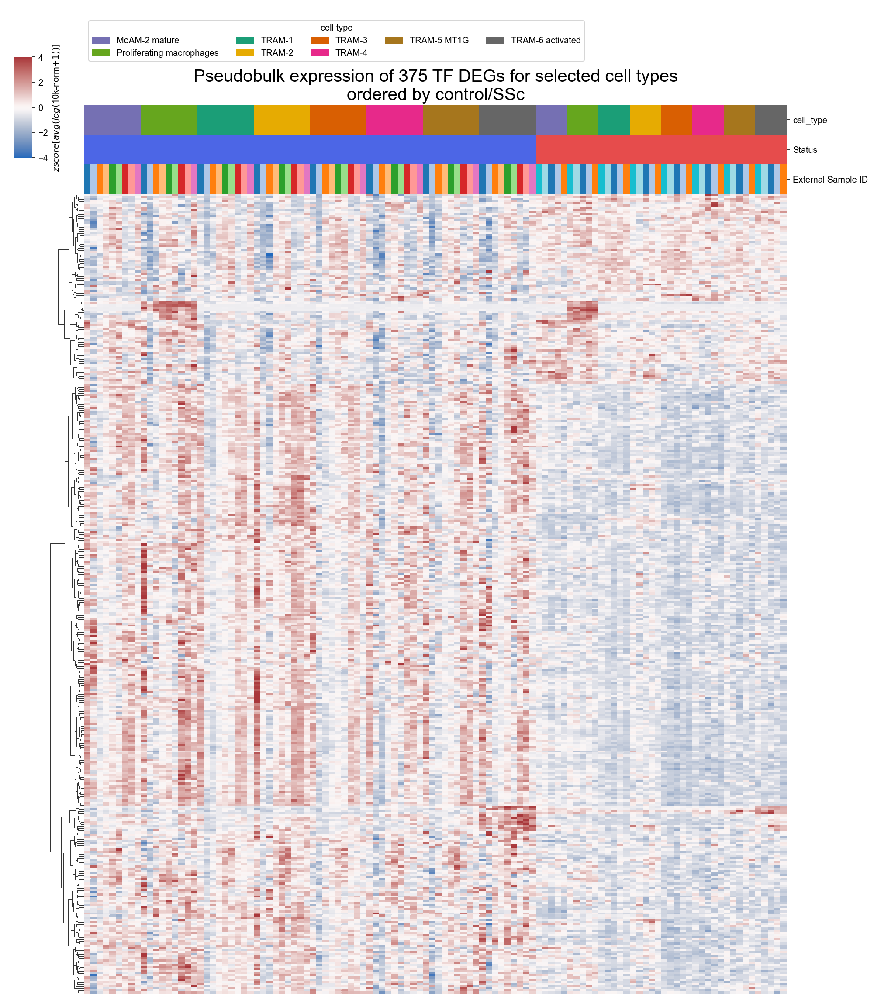

In [ ]:
cg = sns.clustermap(
    pseudobulk.loc[sample_order].T,
    figsize=(14, 16),
    method='ward',
    col_cluster=False,
    col_colors=col_colors_df.loc[sample_order],
    yticklabels=[],
    xticklabels=[],
    cmap='vlag',
    center=0,
    vmin=-4,
    vmax=4,
    cbar_kws={'label': '$zscore[avg(log($10k-norm$ + 1))]$'},
    cbar_pos=(0.02, 0.84, 0.02, 0.1),
    dendrogram_ratio=0.1,
)
cg.ax_col_colors.tick_params(left=False, labelleft=False, right=True, labelright=True)
cg.ax_col_colors.legend(
    handles=legend_handles['cell_type'],
    title='cell type',
    ncol=5,
    loc='upper left',
    bbox_to_anchor=(0, 2)
)
cg.ax_col_colors.set_title(
    f'Pseudobulk expression of {all_tfs.size} TF DEGs for selected cell types\n'
    'ordered by control/SSc',
    size=20
)

## 4.4 DEGs from selected cell types with $|log_2FC| > 0.7$

Based on above histogram of $log_2$ fold changes, let's take only DEGs with at least $0.7$ $log_2$ fold change.

1. Collect all DEGs

In [125]:
all_degs = []
all_degs_data = []
for ct, info in data.items():
    if ct not in deg_cell_types:
        continue
    degs = info['filtered_degs']
    degs_slice = degs.loc[degs.sign.notna() & degs.log2FoldChange.abs().gt(0.7)]
    degs_names = degs_slice.index.tolist()
    all_degs.append(degs_names)
    all_degs_data.append(degs_slice)
all_degs_data = pd.concat(all_degs_data, axis=0)
all_degs = functools.reduce(np.union1d, all_degs)

In [126]:
all_degs.size

1023

In [127]:
all_degs_data['lfc_abs'] = all_degs_data.log2FoldChange.abs()

In [128]:
all_degs_data = all_degs_data.sort_values('lfc_abs', ascending=False).reset_index().rename(
    columns={'index': 'gene'}
).groupby('gene').head(1)

In [129]:
all_degs_data.shape

(1023, 9)

2. Take pseudobulks

In [130]:
metadata_df = ds_processed.obs.loc[
    ds_processed.obs.Chemistry.eq("10x 3' V3")
    & ds_processed.obs.cell_type.isin(deg_cell_types)
][
    ['External Sample ID', 'cell_type', 'Status']
].drop_duplicates(subset=['External Sample ID', 'cell_type'])

In [131]:
pseudobulk = np.zeros((metadata_df.shape[0], all_degs.size))
gene_idx = ds_processed.raw.var_names.isin(all_degs)
gene_names = ds_processed.raw.var_names[gene_idx]
for i, (_, metadata_row) in enumerate(metadata_df.iterrows()):
    metadata_idx = (
        ds_processed.obs.cell_type.eq(metadata_row.cell_type)
        & ds_processed.obs['External Sample ID'].eq(metadata_row['External Sample ID'])
    )
    pseudobulk[i, :] = ds_processed.raw.X[metadata_idx][:, gene_idx].mean(axis=0)

In [132]:
pseudobulk.shape

(112, 1023)

In [133]:
pseudobulk = pd.DataFrame(pseudobulk, index=metadata_df.index, columns=gene_names)

Z-score pseudobulk

In [134]:
pseudobulk = ((pseudobulk - pseudobulk.mean(axis=0)) / pseudobulk.std(axis=0))

In [135]:
metadata_df.Status = pd.Categorical(metadata_df.Status, categories=['control', 'SSc'])

In [136]:
metadata_df.cell_type = metadata_df.cell_type.astype(str)

In [137]:
col_colors_df = get_color_annotations(metadata_df, {
    'cell_type': 'Dark2',
    'Status': [(0.3, 0.4, 0.9), (0.9, 0.3, 0.3)],
    'External Sample ID': 'tab20'
})

In [138]:
sample_order = metadata_df.sort_values(
    ['cell_type', 'Status', 'External Sample ID']
).index

In [139]:
legend_handles = {}
for l in ('cell_type',):
    legend_handles[l] = []
    labels = metadata_df[[l]].drop_duplicates().sort_values(l)
    colors = col_colors_df.loc[labels.index, l]
    for label, color in zip(labels[l], colors):
        legend_handles[l].append(mpl.patches.Patch(
            label=label,
            color=color
        ))

/projects/b1038/Pulmonary/nmarkov/ssc-v2/code/venv/lib/python3.9/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


Text(0.5, 1.0, 'Pseudobulk expression of 1023 DEGs for selected cell types\nwith $log_2FC > 0.7$')

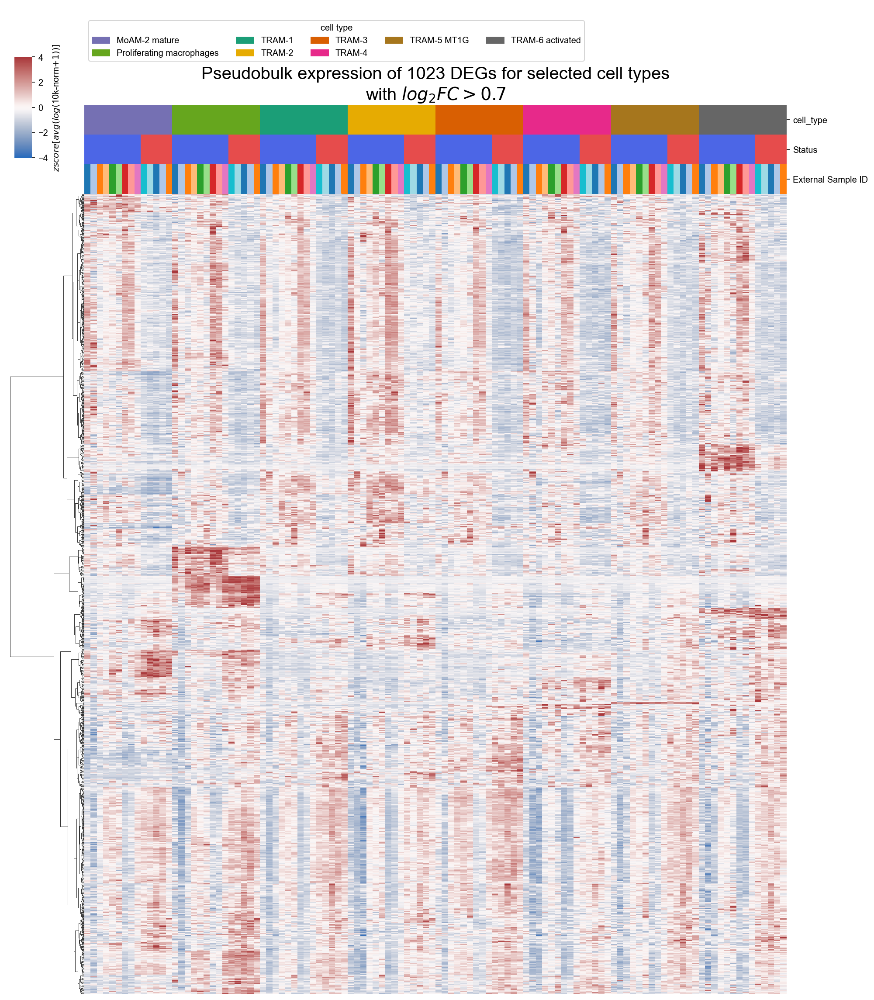

In [ ]:
cg = sns.clustermap(
    pseudobulk.loc[sample_order].T,
    figsize=(14, 16),
    method='ward',
    col_cluster=False,
    col_colors=col_colors_df.loc[sample_order],
    yticklabels=[],
    xticklabels=[],
    cmap='vlag',
    center=0,
    vmin=-4,
    vmax=4,
    cbar_kws={'label': '$zscore[avg(log($10k-norm$ + 1))]$'},
    cbar_pos=(0.02, 0.84, 0.02, 0.1),
    dendrogram_ratio=0.1,
)
cg.ax_col_colors.tick_params(left=False, labelleft=False, right=True, labelright=True)
cg.ax_col_colors.legend(
    handles=legend_handles['cell_type'],
    title='cell type',
    ncol=5,
    loc='upper left',
    bbox_to_anchor=(0, 2)
)
cg.ax_col_colors.set_title(
    f'Pseudobulk expression of {all_degs.size} DEGs for selected cell types\n'
    'with $log_2FC > 0.7$',
    size=20
)

In [141]:
sample_order = metadata_df.sort_values(
    ['Status', 'cell_type', 'External Sample ID']
).index

Text(0.5, 1.0, 'Pseudobulk expression of 1023 DEGs for selected cell types\nwith $log_2FC > 0.7$, ordered by control/SSc')

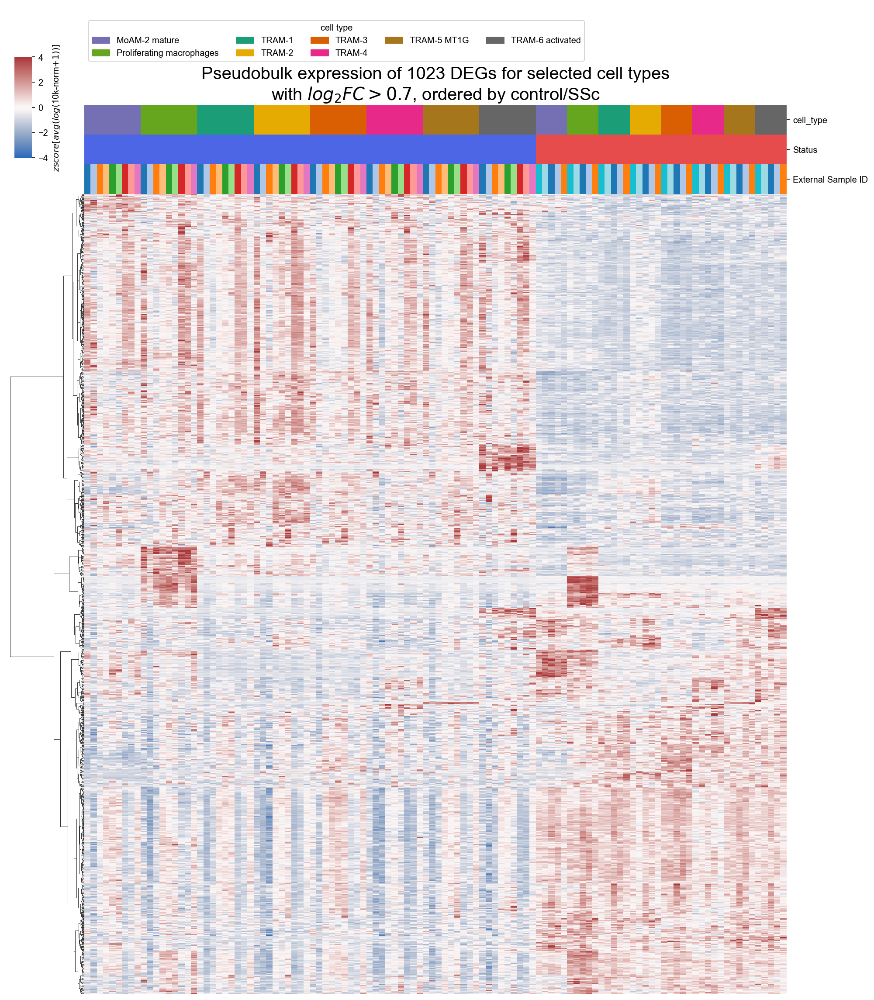

In [ ]:
cg = sns.clustermap(
    pseudobulk.loc[sample_order].T,
    figsize=(14, 16),
    method='ward',
    col_cluster=False,
    col_colors=col_colors_df.loc[sample_order],
    yticklabels=[],
    xticklabels=[],
    cmap='vlag',
    center=0,
    vmin=-4,
    vmax=4,
    cbar_kws={'label': '$zscore[avg(log($10k-norm$ + 1))]$'},
    cbar_pos=(0.02, 0.84, 0.02, 0.1),
    dendrogram_ratio=0.1,
)
cg.ax_col_colors.tick_params(left=False, labelleft=False, right=True, labelright=True)
cg.ax_col_colors.legend(
    handles=legend_handles['cell_type'],
    title='cell type',
    ncol=5,
    loc='upper left',
    bbox_to_anchor=(0, 2)
)
cg.ax_col_colors.set_title(
    f'Pseudobulk expression of {all_degs.size} DEGs for selected cell types\n'
    'with $log_2FC > 0.7$, ordered by control/SSc',
    size=20
)

In [143]:
gene_clusters = pd.DataFrame({
    'cluster': scipy.cluster.hierarchy.cut_tree(cg.dendrogram_row.linkage, n_clusters=6).reshape(-1),
}, index=pseudobulk.columns)

In [144]:
row_colors = get_color_annotations(gene_clusters, {
    'cluster': 'tab10'
})

Text(0.5, 1.0, 'Pseudobulk expression of 1023 DEGs for selected cell types\nwith $log_2FC > 0.7$, ordered by control/SSc')

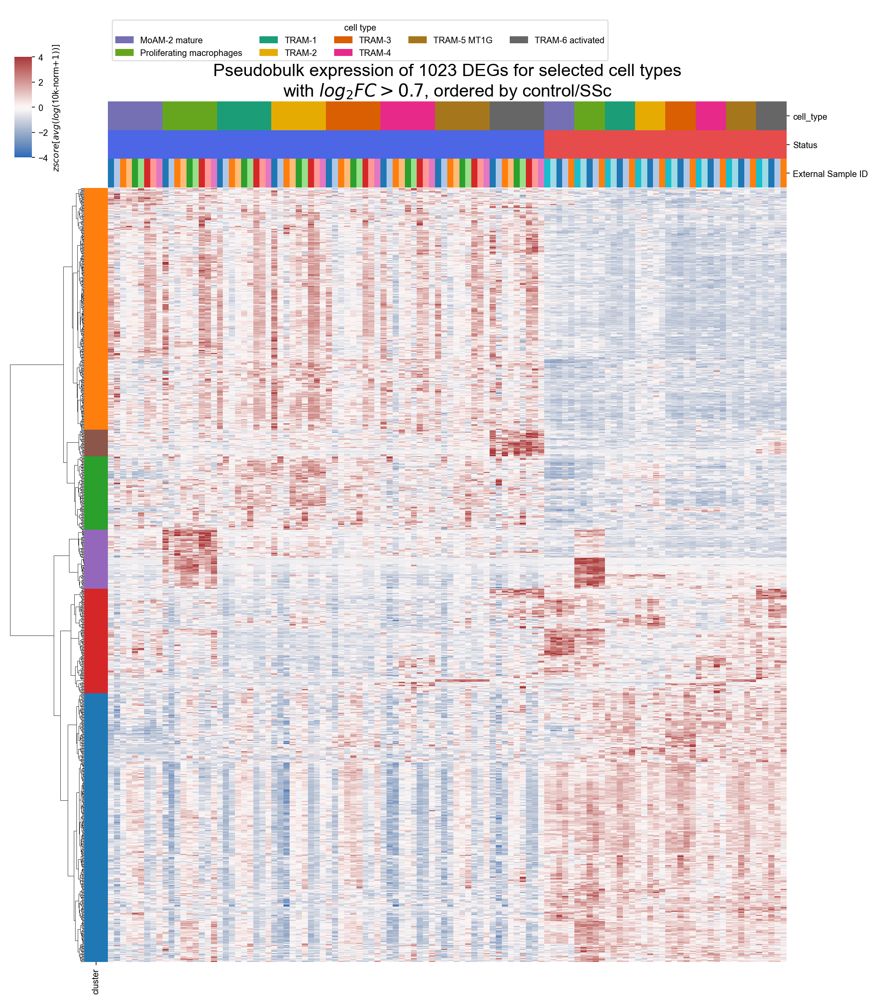

In [ ]:
cg = sns.clustermap(
    pseudobulk.loc[sample_order].T,
    figsize=(14, 16),
    method='ward',
    col_cluster=False,
    col_colors=col_colors_df.loc[sample_order],
    row_colors=row_colors,
    yticklabels=[],
    xticklabels=[],
    cmap='vlag',
    center=0,
    vmin=-4,
    vmax=4,
    cbar_kws={'label': '$zscore[avg(log($10k-norm$ + 1))]$'},
    cbar_pos=(0.02, 0.84, 0.02, 0.1),
    dendrogram_ratio=0.1,
)
cg.ax_col_colors.tick_params(left=False, labelleft=False, right=True, labelright=True)
cg.ax_col_colors.legend(
    handles=legend_handles['cell_type'],
    title='cell type',
    ncol=5,
    loc='upper left',
    bbox_to_anchor=(0, 2)
)
cg.ax_col_colors.set_title(
    f'Pseudobulk expression of {all_degs.size} DEGs for selected cell types\n'
    'with $log_2FC > 0.7$, ordered by control/SSc',
    size=20
)

In [146]:
all_degs_data = all_degs_data.loc[all_degs_data.log2FoldChange.abs().gt(0.7)].set_index('gene')

In [147]:
all_degs_data['cluster'] = gene_clusters.cluster[all_degs_data.index]

In [148]:
all_degs_data.to_csv(os.path.join(analysis_base, '03_heatmaps_logfc_gt_0.7_genes.csv'))

In [149]:
all_degs_data.cluster.value_counts()

0    355
1    320
3    138
2     97
4     78
5     35
Name: cluster, dtype: int64

Narrow down on cluster 3, MoAM-3 DEGs

In [150]:
all_degs_data.loc[all_degs_data.cluster.eq(3)].sort_values('lfc_abs', ascending=False).head(40)

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,sign,lfc_abs,cluster
gene,,,,,,,,,
CXCL5,494.723326,-3.221311,0.455590,-7.070640,1.542210e-12,1.683708e-09,Up in SSc,3.221311,3
RNASE1,973.667996,-2.837701,1.048070,-2.707550,6.778187e-03,3.320192e-02,Up in SSc,2.837701,3
FCGR2B,75.163321,-2.804260,0.400872,-6.995390,2.645213e-12,9.017814e-10,Up in SSc,2.804260,3
EMP1,73.521770,-2.788614,0.570286,-4.889849,1.009132e-06,7.664140e-05,Up in SSc,2.788614,3
PLA2G7,127.599431,-2.712122,0.601898,-4.505952,6.607599e-06,2.380588e-04,Up in SSc,2.712122,3
CCL2,181.958273,-2.695783,0.876181,-3.076741,2.092769e-03,1.491243e-02,Up in SSc,2.695783,3
CCL3,43.005630,-2.635460,0.964361,-2.732857,6.278751e-03,2.967457e-02,Up in SSc,2.635460,3
A2M,88.858616,-2.263455,0.444538,-5.091708,3.548522e-07,2.510010e-05,Up in SSc,2.263455,3
MARCKS,149.942446,-2.152301,0.260860,-8.250803,1.573333e-16,1.213040e-12,Up in SSc,2.152301,3


#### Save for Morpheus

In [151]:
GENERATOR = 'Nick'

In [152]:
DEGS_DIR = pathlib.Path('11c_degs_heatmap')

In [153]:
os.makedirs(DEGS_DIR, exist_ok=True)

In [154]:
result_df_morpheus = pseudobulk.loc[sample_order].T.copy()
result_df_morpheus = result_df_morpheus.iloc[cg.dendrogram_row.reordered_ind]
result_df_morpheus.columns = (
    metadata_df.loc[sample_order]['External Sample ID'].astype(str)
    + '_'
    + metadata_df.loc[sample_order]['cell_type'].astype(str)
).values
result_df_morpheus.to_csv(DEGS_DIR / 'expr.tsv', sep='\t')

In [155]:
gene_info_morpheus = all_degs_data.reset_index()
gene_info_morpheus['cluster'] = 'c' + gene_info_morpheus['cluster'].astype(str)
gene_info_morpheus.to_csv(DEGS_DIR / 'gene_info.tsv', sep='\t')

In [156]:
sample_info = pd.read_csv('../00all-samples.csv')

In [157]:
clinical_info = pd.read_csv('../00clinical-v2.csv')

In [159]:
metadata_df_morpheus = metadata_df.loc[sample_order].merge(
    sample_info[['External Sample ID', 'Sample', 'Sex']],
    on='External Sample ID',
    how='left'
).merge(
    clinical_info,
    left_on='Sample',
    right_on='study_code',
    how='left'
)

In [ ]:
metadata_df_morpheus = metadata_df_morpheus[[
    'External Sample ID', 'cell_type', 'Status', 'Sex',
    'fvc_pred', 'k_score_ggo', 'k_score_fib'
]].rename(columns={
    'External Sample ID': 'Patient',
    'cell_type': 'Cell type',
    'fvc_pred': 'FVC',
    'k_score_gg': 'HRCT_ggo',
    'k_score_fib': 'HRCT_fib'
})
metadata_df_morpheus['id'] = (
    metadata_df_morpheus['Patient']
    + '_'
    + metadata_df_morpheus['Cell type']
)
metadata_df_morpheus.to_csv(DEGS_DIR / 'meta.tsv', sep='\t')

In [162]:
HTML = """
<!DOCTYPE html>
<html>
<head>
    <meta name="viewport" content="width=device-width, initial-scale=1.0"/>
    <meta http-equiv="content-type" content="text/html; charset=utf8"/>
    <title>SSc DEGs heatmap V3 chemitsy</title>
    <style type="text/css">
        html {
          margin: 0; padding: 0;
          font-size: 20px; font-family: Helvetica, Verdana, sans-serif;
        }
        body {margin: 0; padding: 10px 10px;}
        a {color: #1385cb}
        a:visited {color: #0e74bc}
        .header {margin-bottom: 10px;}
        .header h2, .header h3 {font-weight: normal; text-align: center; margin: 0 0 6px 0;}
        #morpheus-container {
            width: auto;
            height: auto;
            min-width: 1200px;
            min-height: 800px;
            visibility: hidden;
        }
      </style>
    <link rel="stylesheet" href="https://software.broadinstitute.org/morpheus/css/morpheus-latest.min.css">
    <script>if (typeof module === 'object') {
    window.module = module;
    module = undefined;

    }</script>

    <script type="text/javascript" src="https://software.broadinstitute.org/morpheus/js/morpheus-external-latest.min.js"></script>
    <script src="https://software.broadinstitute.org/morpheus/js/morpheus-latest.min.js"></script>
</head>
<body>
    <div class="header">
        <h2>SSc DEGs heatmap V3 chemitsy (log2FC > 0.7)</h2>
        Generated by %s on %s<br/><br/>
        <b>Red is SSc, Blue is Healthy</b>
    </div>
    <div id="morpheus-container"></div>

    <script type="text/javascript">
        window.heatmap = new morpheus.HeatMap({
            el: document.querySelector('#morpheus-container'),
            name: "GSEA on v3 DEGs",
            dataset: "expr.tsv",
            columns: [
                {field: "Cell type", display: ["color"]},
                {field: "Status", display: ["color"]},
                {field: "Patient", display: ["color"]},
                {field: "Sex", display: ["color"]},
                {field: "FVC", display: ["color"]},
                {field: "HRCT_fib", display: ["color"]},
                {field: "HRCT_ggo", display: ["color"]}
            ],
            rows: [
                {field: "id", display: ["text"]},
                {field: "cluster", display: ["color"]}
            ],
            columnAnnotations: [{
                file: "meta.tsv",
                datasetField: "id",
                fileField: "id"
            }],
            rowAnnotations: [{
                file: "gene_info.tsv",
                datasetField: "id",
                fileField: "gene"
            }],
            columnColorModel: {
                "Status": {
                    "control": "blue",
                    "SSc": "red"
                }
            },
            rowColorModel: {
                "cluster": {
                    "c0": "#1f77b4",
                    "c1": "#ff7f0e",
                    "c2": "#2ca02c",
                    "c3": "#d62728",
                    "c4": "#9467bd",
                    "c5": "#8c564b"
                }
            },
            colorScheme: { // optional color scheme. default is relative
                type: 'fixed',
                map: [{
                    value: 4,
                    color: '#ff0000'
                }, {
                    value: 0,
                    color: '#ffffff'
                }, {
                    value: -4,
                    color: '#0000ff'
                }]
            }
        });
        window.onload = function() {
            window.setTimeout(function() {
                window.heatmap.fitToWindow({fitRows: true, fitColumns: true, repaint: true});
                window.heatmap.fitToWindow({fitRows: true, fitColumns: true, repaint: true});
                document.getElementById('morpheus-container').style.visibility = 'visible';
            }, 200)
        }
    </script>
</body>
</html>
"""

In [163]:
html = HTML % (
    GENERATOR,
    datetime.datetime.now().strftime('%d %b %Y, %I:%M%p')
)

In [164]:
with open(DEGS_DIR / 'index.html', 'w') as out:
    out.write(html)

#### Explore cluster 3

In [ ]:
go_cluster_3 = run_go(
    all_degs_data.index[all_degs_data.cluster.eq(3)],
    data["TRAM-1"]["filtered_degs"].index
)

**NOTE: DEFAULT TAXID STORED FROM gene2go IS 9606 (human)

HMS:0:01:08.535172 346,070 annotations, 20,758 genes, 18,733 GOs, 1 taxids READ: gene2go 

Load BP Gene Ontology Analysis ...
fisher module not installed.  Falling back on scipy.stats.fisher_exact
     12 items WROTE: __go_temp_file


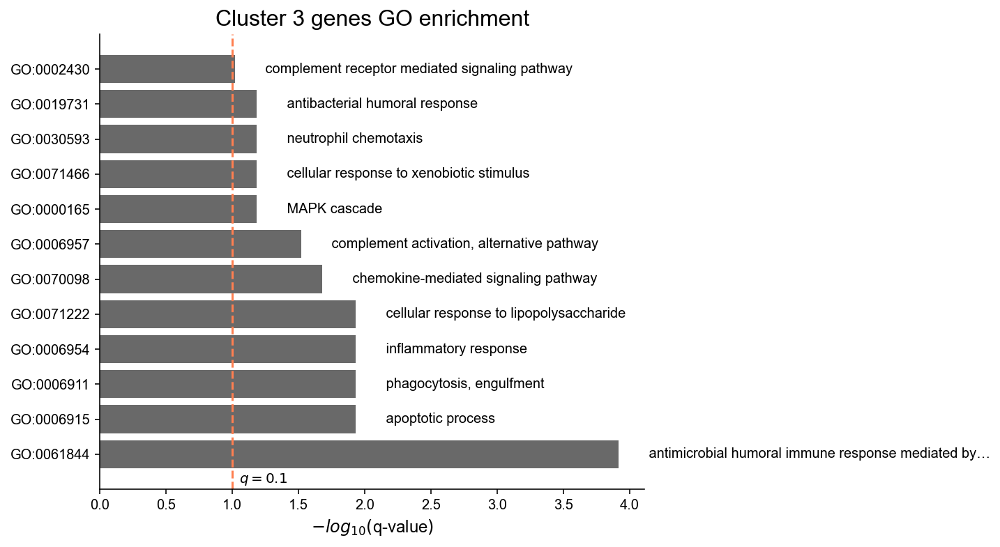

In [ ]:
go_to_plot = go_cluster_3.loc[go_cluster_3.enrichment.eq('e')]
fig, ax = plt.subplots(figsize=(7, 6))
ax.barh(range(go_to_plot.shape[0]), -np.log10(go_to_plot.p_fdr_bh), fc='dimgray')
ax.axvline(x=-np.log10(0.1), c='coral', ls='--')
ax.annotate(
    '$q=0.1$',
    (-np.log10(0.1), -0.5),
    xytext=(10, 0),
    textcoords='offset pixels',
    va='top'
)
ax.set_title('Cluster 3 genes GO enrichment', size=16)
ax.set_yticks(list(range(go_to_plot.shape[0])))
ax.set_yticklabels(go_to_plot['# GO']);
ax.set_xlabel('$-log_{10}($q-value$)$', size=12)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
for i, (_, row) in enumerate(go_to_plot.iterrows()):
    name = ''
    char_limit = 50
    for word in row['name'].split():
        if len(name) + len(word) + 1 > char_limit:
            name += '…'
            break
        name += f' {word}'
    ax.text(-np.log10(row.p_fdr_bh) + 0.2, i, name, va='center')

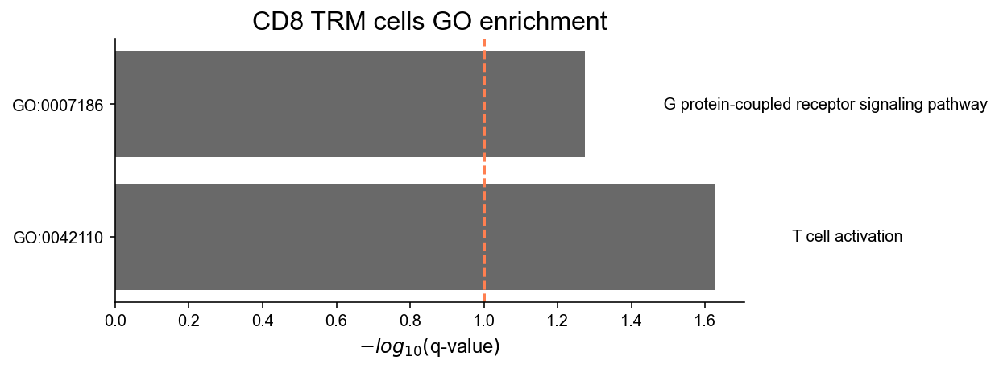

In [ ]:
go_to_plot = data['CD8 TRM cells']['go_ssc']
fig, ax = plt.subplots(figsize=(7, 3))
ax.barh(range(go_to_plot.shape[0]), -np.log10(go_to_plot.p_fdr_bh), fc='dimgray')
ax.axvline(x=-np.log10(0.1), c='coral', ls='--')
ax.annotate(
    '$q=0.1$',
    (-np.log10(0.1), -0.5),
    xytext=(10, 0),
    textcoords='offset pixels',
    va='top'
)
ax.set_title('CD8 TRM cells GO enrichment', size=16)
ax.set_yticks(list(range(go_to_plot.shape[0])))
ax.set_yticklabels(go_to_plot['# GO']);
ax.set_xlabel('$-log_{10}($q-value$)$', size=12)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
for i, (_, row) in enumerate(go_to_plot.iterrows()):
    name = ''
    char_limit = 50
    for word in row['name'].split():
        if len(name) + len(word) + 1 > char_limit:
            name += '…'
            break
        name += f' {word}'
    ax.text(-np.log10(row.p_fdr_bh) + 0.2, i, name, va='center')

In [168]:
for i in data['CD8 TRM cells']['go_ssc'].study_items.tolist():
    print(i)

CD2, CD3E, CD3G, CD7, CD8A, CD8B, FKBP1A, LAT, TNFSF14
CALM2, CCL4, CCL5, CD3E, CXCR3, CXCR6, GNG5, RAC2, RGS10, XCL1


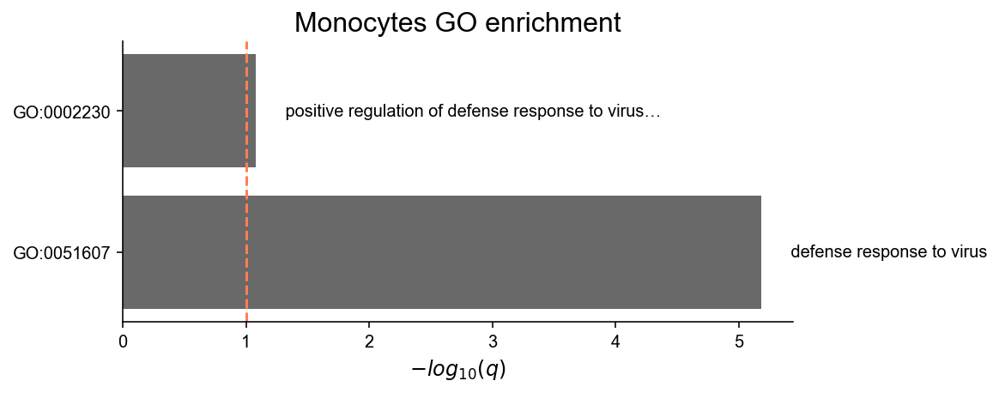

In [ ]:
go_to_plot = data['Monocytes']['go_control']
fig, ax = plt.subplots(figsize=(7, 3))
ax.barh(range(go_to_plot.shape[0]), -np.log10(go_to_plot.p_fdr_bh), fc='dimgray')
ax.axvline(x=-np.log10(0.1), c='coral', ls='--')
ax.annotate(
    '$q=0.1$',
    (-np.log10(0.1), -0.5),
    xytext=(10, 0),
    textcoords='offset pixels',
    va='top'
)
ax.set_title('Monocytes GO enrichment', size=16)
ax.set_yticks(list(range(go_to_plot.shape[0])))
ax.set_yticklabels(go_to_plot['# GO']);
ax.set_xlabel('$-log_{10}(q)$', size=12)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
for i, (_, row) in enumerate(go_to_plot.iterrows()):
    name = ''
    char_limit = 50
    for word in row['name'].split():
        if len(name) + len(word) + 1 > char_limit:
            name += '…'
            break
        name += f' {word}'
    ax.text(-np.log10(row.p_fdr_bh) + 0.2, i, name, va='center')

In [170]:
for _, i in data['Monocytes']['go_control'].iterrows():
    print(i['name'])
    print(i.study_items)

defense response to virus
DTX3L, EIF2AK2, GBP1, HERC5, IFIT3, IRF1, LYST, MLKL, MX1, OAS2, PARP9, SETD2, STAT1, TMEM173, TRIM22, TRIM56
positive regulation of defense response to virus by host
DTX3L, PARP9, STAT1, TMEM173, TRIM22


# IFN responses

1. Collect genes

In [171]:
all_genes = np.union1d(HALLMARK_IFN_ALPHA_R, HALLMARK_IFN_GAMMA_R)

In [172]:
all_genes = np.intersect1d(all_genes, ds_processed.raw.var_names)

In [173]:
all_genes.size

220

In [174]:
ifn_cell_types = [
    'Monocytes', 'MoAM-1', 'MoAM-3 profibrotic',
    'Interstitial macrophages', 'DC2'
]

2. Take pseudobulks

In [175]:
metadata_df = ds_processed.obs.loc[
    ds_processed.obs.Chemistry.eq("10x 3' V3")
    & ds_processed.obs.cell_type.isin(ifn_cell_types)
][
    ['External Sample ID', 'cell_type', 'Status']
].drop_duplicates(subset=['External Sample ID', 'cell_type'])
metadata_df.cell_type = pd.Categorical(metadata_df.cell_type, categories=ifn_cell_types)

In [176]:
pseudobulk = np.zeros((metadata_df.shape[0], all_genes.size))
gene_idx = ds_processed.raw.var_names.isin(all_genes)
gene_names = ds_processed.raw.var_names[gene_idx]
for i, (_, metadata_row) in enumerate(metadata_df.iterrows()):
    metadata_idx = (
        ds_processed.obs.cell_type.eq(metadata_row.cell_type)
        & ds_processed.obs['External Sample ID'].eq(metadata_row['External Sample ID'])
    )
    pseudobulk[i, :] = ds_processed.raw.X[metadata_idx][:, gene_idx].mean(axis=0)

In [177]:
pseudobulk.shape

(66, 220)

In [178]:
pseudobulk = pd.DataFrame(pseudobulk, index=metadata_df.index, columns=gene_names)

Z-score pseudobulk

In [179]:
pseudobulk = ((pseudobulk - pseudobulk.mean(axis=0)) / pseudobulk.std(axis=0))

In [180]:
metadata_df.Status = pd.Categorical(metadata_df.Status, categories=['control', 'SSc'])

In [181]:
# metadata_df.cell_type = metadata_df.cell_type.astype(str)

In [ ]:
ifn_cell_types_colors = [
    c
    for ct, c
    in zip(
        ds_processed.obs.cell_type.cat.categories,
        ds_processed.uns['cell_type_colors']
    )
    if ct in ifn_cell_types
]
col_colors_df = get_color_annotations(metadata_df, {
    'cell_type': ifn_cell_types_colors,
    'Status': ['royalblue', 'firebrick'],
    # 'External Sample ID': 'tab20'
})

In [183]:
sample_order = metadata_df.sort_values(
    ['cell_type', 'Status', 'External Sample ID']
).index

In [184]:
legend_handles = {}
for l in ('cell_type',):
    legend_handles[l] = []
    labels = metadata_df[[l]].drop_duplicates().sort_values(l)
    colors = col_colors_df.loc[labels.index, l]
    for label, color in zip(labels[l], colors):
        legend_handles[l].append(mpl.patches.Patch(
            label=label,
            color=color
        ))

/projects/b1038/Pulmonary/nmarkov/ssc-v2/code/venv/lib/python3.9/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


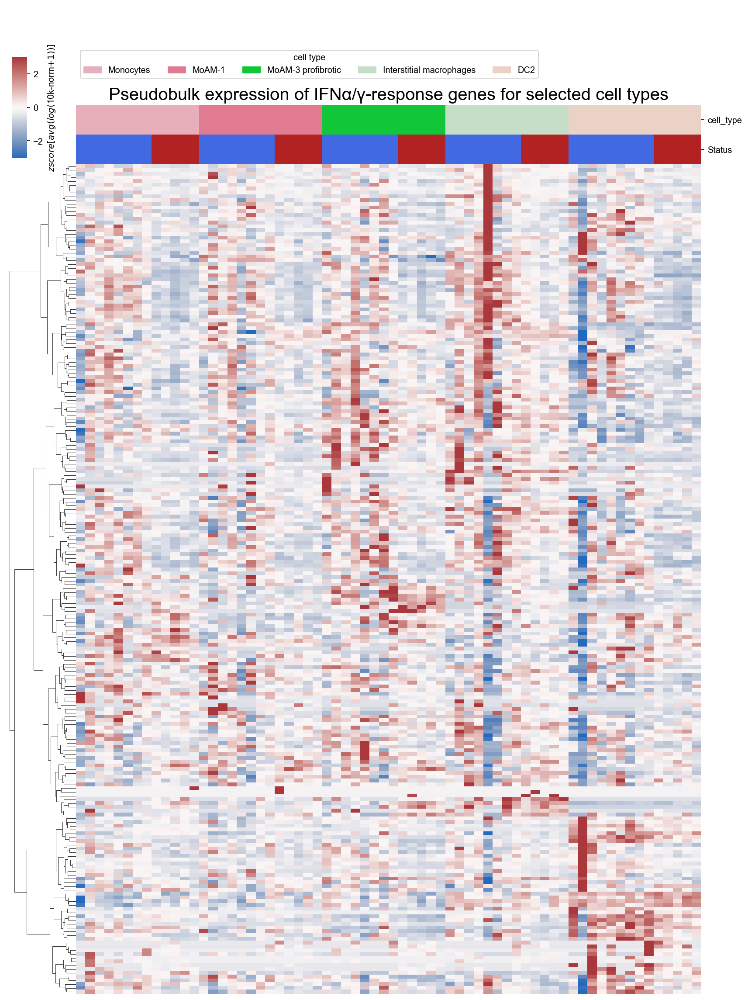

In [ ]:
cg = sns.clustermap(
    pseudobulk.loc[sample_order].T,
    figsize=(12, 16),
    method='ward',
    col_cluster=False,
    col_colors=col_colors_df.loc[sample_order],
    yticklabels=[],
    xticklabels=[],
    cmap='vlag',
    center=0,
    vmin=-3,
    vmax=3,
    cbar_kws={'label': '$zscore[avg(log($10k-norm$ + 1))]$'},
    cbar_pos=(0.02, 0.84, 0.02, 0.1),
    dendrogram_ratio=0.1,
)
cg.ax_col_colors.tick_params(left=False, labelleft=False, right=True, labelright=True)
cg.ax_col_colors.legend(
    handles=legend_handles['cell_type'],
    title='cell type',
    ncol=5,
    loc='upper left',
    bbox_to_anchor=(0, 2)
)
cg.ax_col_colors.set_title(
    'Pseudobulk expression of IFNα/γ-response genes for selected cell types',
    size=20
)

cg.ax_col_colors.collections[0].set_rasterized(True)
cg.ax_heatmap.collections[0].set_rasterized(True)
cg.ax_col_dendrogram.figure.savefig('00_figures/Figure_4D_ifn_response.pdf', dpi=300)

### Export to morpheus

In [186]:
GENERATOR = 'Nick'

In [187]:
DEGS_DIR = pathlib.Path('11c_ifn_resp_heatmap')

In [188]:
os.makedirs(DEGS_DIR, exist_ok=True)

In [189]:
result_df_morpheus = pseudobulk.loc[sample_order].T.copy()
result_df_morpheus = result_df_morpheus.iloc[cg.dendrogram_row.reordered_ind]
result_df_morpheus.columns = (
    metadata_df.loc[sample_order]['External Sample ID'].astype(str)
    + '_'
    + metadata_df.loc[sample_order]['cell_type'].astype(str)
).values
result_df_morpheus.to_csv(DEGS_DIR / 'expr.tsv', sep='\t')

In [193]:
metadata_df_morpheus = metadata_df.loc[sample_order].merge(
    sample_info[['External Sample ID', 'Sample', 'Sex']],
    on='External Sample ID',
    how='left'
).merge(
    clinical_info,
    left_on='Sample',
    right_on='study_code',
    how='left'
)

In [ ]:
metadata_df_morpheus = metadata_df_morpheus[[
    'External Sample ID', 'cell_type', 'Status', 'Sex',
    'fvc_pred', 'k_score_ggo', 'k_score_fib'
]].rename(columns={
    'External Sample ID': 'Patient',
    'cell_type': 'Cell type',
    'fvc_pred': 'FVC',
    'k_score_gg': 'HRCT_ggo',
    'k_score_fib': 'HRCT_fib'
})
metadata_df_morpheus['id'] = (
    metadata_df_morpheus['Patient'].astype(str)
    + '_'
    + metadata_df_morpheus['Cell type'].astype(str)
)
metadata_df_morpheus.to_csv(DEGS_DIR / 'meta.tsv', sep='\t')

In [195]:
HTML = """
<!DOCTYPE html>
<html>
<head>
    <meta name="viewport" content="width=device-width, initial-scale=1.0"/>
    <meta http-equiv="content-type" content="text/html; charset=utf8"/>
    <title>SSc IFNa/g response heatmap V3 chemitsy</title>
    <style type="text/css">
        html {
          margin: 0; padding: 0;
          font-size: 20px; font-family: Helvetica, Verdana, sans-serif;
        }
        body {margin: 0; padding: 10px 10px;}
        a {color: #1385cb}
        a:visited {color: #0e74bc}
        .header {margin-bottom: 10px;}
        .header h2, .header h3 {font-weight: normal; text-align: center; margin: 0 0 6px 0;}
        #morpheus-container {
            width: auto;
            height: auto;
            min-width: 1200px;
            min-height: 800px;
            visibility: hidden;
        }
      </style>
    <link rel="stylesheet" href="https://software.broadinstitute.org/morpheus/css/morpheus-latest.min.css">
    <script>if (typeof module === 'object') {
    window.module = module;
    module = undefined;

    }</script>

    <script type="text/javascript" src="https://software.broadinstitute.org/morpheus/js/morpheus-external-latest.min.js"></script>
    <script src="https://software.broadinstitute.org/morpheus/js/morpheus-latest.min.js"></script>
</head>
<body>
    <div class="header">
        <h2>SSc IFNa/g-response genes heatmap V3 chemitsy</h2>
        Generated by %s on %s<br/><br/>
        <b>Red is SSc, Blue is Healthy</b>
    </div>
    <div id="morpheus-container"></div>

    <script type="text/javascript">
        window.heatmap = new morpheus.HeatMap({
            el: document.querySelector('#morpheus-container'),
            name: "GSEA on v3 DEGs",
            dataset: "expr.tsv",
            columns: [
                {field: "Cell type", display: ["color"]},
                {field: "Status", display: ["color"]},
                {field: "Patient", display: ["color"]},
                {field: "Sex", display: ["color"]},
                {field: "FVC", display: ["color"]},
                {field: "HRCT_fib", display: ["color"]},
                {field: "HRCT_ggo", display: ["color"]}
            ],
            rows: [
                {field: "id", display: ["text"]},
            ],
            columnAnnotations: [{
                file: "meta.tsv",
                datasetField: "id",
                fileField: "id"
            }],
            columnColorModel: {
                "Status": {
                    "control": "blue",
                    "SSc": "red"
                }
            },
            colorScheme: { // optional color scheme. default is relative
                type: 'fixed',
                map: [{
                    value: 3,
                    color: '#ff0000'
                }, {
                    value: 0,
                    color: '#ffffff'
                }, {
                    value: -3,
                    color: '#0000ff'
                }]
            }
        });
        window.onload = function() {
            window.setTimeout(function() {
                window.heatmap.fitToWindow({fitRows: true, fitColumns: true, repaint: true});
                window.heatmap.fitToWindow({fitRows: true, fitColumns: true, repaint: true});
                document.getElementById('morpheus-container').style.visibility = 'visible';
            }, 200)
        }
    </script>
</body>
</html>
"""

In [196]:
html = HTML % (
    GENERATOR,
    datetime.datetime.now().strftime('%d %b %Y, %I:%M%p')
)

In [197]:
with open(DEGS_DIR / 'index.html', 'w') as out:
    out.write(html)